In [2]:
from datetime import datetime

print(f"Timestamp: {datetime.now()}")

Timestamp: 2026-02-23 19:19:37.084831


In [3]:
from pathlib import Path
import sys
import os
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import matplotlib.colors as clr
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as plt
from matplotlib.colors import Normalize
import matplotlib.cm as cm
import seaborn as sns

In [4]:
# plt.rcdefaults()

In [5]:
# plt.rcParams['figure.figsize'] = (4,4)
plt.rcParams['figure.figsize'] = (3,3)
plt.rcParams["figure.dpi"] = 300

In [6]:
# make text editable as words in output plots
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

In [ ]:
sys.path.append(str(Path.cwd().resolve().parents[1]))

from config.paths import BASE_DIR

# Output directories
output_dir = BASE_DIR / "figures"
output_dir.mkdir(parents=True, exist_ok=True)

plot_out_dir = output_dir / "plots"
plot_out_dir.mkdir(parents=True, exist_ok=True)

# Data input paths
# neuron adata with final labels
input_file = BASE_DIR / "data/h5ad/export_04/04c_gamma_subtypes/neurons-final-labels.h5ad"
# global adata
adata_merged_labels_path = BASE_DIR / "data/h5ad/export_03/03b_seurat/adata-merged-labels.h5ad"
# global adata with transgenes included
adata_480_path = BASE_DIR / "data/h5ad/export_02/02b_leiden/adata-leiden-480.h5ad"

# Reporter status table
reporters_path = BASE_DIR / "data/h5ad/export_03/03b_thresholds/reporter_classes_gaussian_thresholds.csv" 

# Ginty reference (private folder - intentionally hardcoded - UPDATE)
input_file_ref = Path("/home/workspace/DRG/MC_private_folder/home/workspace/private/projects/kim/drg/data/scrna-seq/h5ad/04_clustered/GSE139088-scvi-leiden.h5ad")

In [8]:
adata_merged_labels = sc.read_h5ad(adata_merged_labels_path)

In [10]:
adata_480 = sc.read_h5ad(adata_480_path)

In [11]:
adata_480

AnnData object with n_obs × n_vars = 147036 × 480
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample_id', 'output_id', 'region_id', 'slide_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'batch', '_scvi_batch', '_scvi_labels', 'leiden_scVI_1'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'leiden_scVI_1', 'leiden_scVI_1_colors', 'neighbors', 'sample_id_colors', 'slide_id_colors', 'umap'
    obsm: 'X_scVI_ModelB_480', 'X_umap', 'spatial'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [12]:
adata = sc.read_h5ad(input_file)
adata

AnnData object with n_obs × n_vars = 22411 × 475
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample_id', 'output_id', 'region_id', 'slide_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'batch', '_scvi_batch', '_scvi_labels', 'leiden_scVI_1', 'scanvi_labels', 'seurat_labels', 'prediction.score.CGRP.Theta', 'prediction.score.CGRP.Gamma', 'prediction.score.CGRP.Alpha', 'prediction.score.Nonpeptidergic.nociceptors', 'prediction.score.C.LTMR', 'prediction.score.Sst', 'prediction.score.CGRP.Zeta', 'prediction.score.CGRP.Epsilion', 'prediction.score.Proprioceptors', 'prediction.score.Unknown', 'predicti

In [13]:
adata_reference = sc.read_h5ad(input_file_ref)
adata_reference

AnnData object with n_obs × n_vars = 10729 × 20924
    obs: 'original_annotation', 'GSE', 'GSM', 'sample_number', 'sample_id', 'experiment_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribosomal', 'pct_counts_ribosomal', 'doublet_scores', 'predicted_doublets', '_scvi_batch', '_scvi_labels', 'leiden'
    var: 'mt', 'ribosomal', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'original_annotation_colors', 'rank_genes_groups', 'sample_id_colors', 'umap'
    obsm: 'X_scVI', 'X_umap'
    layers: 'counts', 'log1p', 'normalized_1e6'
    obsp: 'connectivities', 'distances'

In [14]:
min(adata_480.obs['total_counts'])

51.0

In [15]:
# remove the barcode suffixes from adata-480 to match adata
adata_480

index_clipped = ["-".join(barcode.split('-')[0:2]) for barcode in adata_480.obs.index]
adata_480.obs.index = index_clipped

In [16]:
adata_480.obs.head()

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,genomic_control_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,...,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_10_genes,pct_counts_in_top_20_genes,pct_counts_in_top_50_genes,pct_counts_in_top_150_genes,batch,_scvi_batch,_scvi_labels,leiden_scVI_1
aaadagcf-1,aaadagcf-1,772.174255,2206.725830,2492,0,0,0,0,0,2492.0,...,5.424950,7.821242,28.932584,47.431782,73.354735,95.947030,0,4,0,3
aaaihgjh-1,aaaihgjh-1,769.295227,2240.681641,4902,0,0,1,0,0,4902.0,...,5.521461,8.497602,22.399021,38.066095,68.298654,96.593227,0,4,0,17
aabcohae-1,aabcohae-1,733.544678,2249.933838,2474,0,0,0,0,0,2474.0,...,5.303305,7.813996,30.557801,46.968472,75.383994,97.978981,0,4,0,17
aabdncpn-1,aabdncpn-1,749.500977,2226.913574,2246,0,0,0,0,0,2246.0,...,5.164786,7.717351,36.242208,55.565450,82.457703,98.931434,0,4,0,19
aabkbaii-1,aabkbaii-1,712.913574,2282.130615,262,0,0,0,0,0,262.0,...,4.564348,5.572154,38.167939,56.870229,82.824427,100.000000,0,4,0,2


## Plotting functions

In [17]:
import matplotlib.pyplot as plt

def plot_umaps(
    adata,
    label_cols,
    true_color_map,
    false_color,
    true_size,
    false_size,
    edgecolor,
    linewidth,
    alpha_false,
    alpha_true,
    figsize=(3, 3),
    save_path  = None
):
    """
    Plot minimalist UMAPs for boolean label columns.
    No title, no axes, no border.
    """

    if "X_umap" not in adata.obsm:
        raise ValueError("No UMAP found in adata.obsm['X_umap'].")

    x, y = adata.obsm["X_umap"][:, 0], adata.obsm["X_umap"][:, 1]

    for col in label_cols:
        if col not in adata.obs.columns:
            print(f"Column `{col}` not in adata.obs — skipping.")
            continue

        if col not in true_color_map:
            raise ValueError(f"Missing true_color_map entry for `{col}`.")

        true_color = true_color_map[col]
        mask = adata.obs[col].astype(bool).values

        plt.figure(figsize=figsize)

        # Plot FALSE background
        plt.scatter(
            x[~mask],
            y[~mask],
            s=false_size,
            c=false_color,
            linewidths=0,
            alpha=alpha_false,
        )

        # Plot TRUE foreground
        plt.scatter(
            x[mask],
            y[mask],
            s=true_size,
            c=true_color,
            linewidths=linewidth,
            edgecolors=edgecolor,
            alpha=alpha_true,
        )

        ax = plt.gca()
        ax.set_aspect("equal", "box")

        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel("")
        ax.set_ylabel("")
        ax.set_title("")  # remove title
        ax.spines["top"].set_visible(False)
        ax.spines["bottom"].set_visible(False)
        ax.spines["left"].set_visible(False)
        ax.spines["right"].set_visible(False)

        plt.tight_layout()

        if save_path is not None:
            plt.savefig(os.path.join(save_path, f"umap_{col}.pdf"), format='pdf', bbox_inches='tight')

        plt.show()

In [18]:
def barplot_dual_distribution(
    adata,
    population_name,
    group_col="neuron_label",
    dual_col="EGFP_dTomato_dual_hi",
    bar_color="black",
    figsize=(4, 4),
    fontsize=11,
    plot_counts = True,
    return_group_order=False,
    group_order=None,
):
    df = adata.obs[[group_col, dual_col]].copy()
    df[dual_col] = df[dual_col].astype(bool)
    df[group_col] = df[group_col].astype(str).replace("nan", "Unknown")

    # Count dual positives per group (correct)
    dual_counts = df.groupby(group_col)[dual_col].sum()

    total_dual = dual_counts.sum()
    print('number +: ', total_dual)

    # percentage
    stats = (dual_counts / total_dual * 100).sort_values(ascending=False)

    if group_order is not None:
        # Use the provided order. .reindex ensures we handle missing/extra groups safely.
        # Fill missing groups with 0 so the bars show up as empty instead of crashing.
        stats = stats.reindex(group_order).fillna(0)
    else:
        # Default: Sort by percentage descending
        stats = stats.sort_values(ascending=False)
    
    # Final order of categories
    final_order = stats.index.tolist()
    sorted_counts = dual_counts.reindex(final_order).fillna(0)

    # # ordered counts
    # sorted_counts = dual_counts.loc[stats.index]

    fig, ax = plt.subplots(figsize=figsize)

    x = np.arange(len(stats))
    if plot_counts:
        ax.bar(x, sorted_counts.values, color=bar_color, alpha=0.9)
    else:
        ax.bar(x, stats.values, color=bar_color, alpha=0.9)

    # xticks
    ax.set_xticks(x)
    ax.set_xticklabels(stats.index, rotation=45, ha="right", fontsize=fontsize)

    # y-axis
    if plot_counts:
        ax.set_ylabel("Count", fontsize=fontsize)
    else:     
        ax.set_ylim(0, 100)  # <-- force axis to show full 0–100%
        ax.set_ylabel(f"% of {population_name} \nneurons", fontsize=fontsize)
    ax.set_xlabel("")

    # minimalist styling
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(axis="y", length=0)
    ax.tick_params(axis="x", length=0)

    plt.subplots_adjust(bottom=0.28)
    if return_group_order:
        return fig, final_order
    return fig

## Confirm key aspects of processed dataset

In [19]:
# prior to neuron transcript filtering
min(adata_merged_labels.obs['total_counts'])

51.0

In [20]:
# neurons where thresholded at 1000 transcripts/cell
min(adata.obs['total_counts'])

1000.0

## Add / update reporter status 

In [22]:
reporter_classes_updated_dual = pd.read_csv(reporters_path, index_col = 0)
reporter_classes_updated_dual.head()

cols_update = ['EGFP_Seq1_hi', 'dTomato_Seq2_hi', 'EGFP_dTomato_dual_hi', 'reporter_status']
for col in cols_update:
    if col in adata.obs.columns:
        del adata.obs[col]

# add individual reporter columns
adata.obs = adata.obs.join(reporter_classes_updated_dual[['EGFP_Seq1_hi', 'dTomato_Seq2_hi', 'EGFP_dTomato_dual_hi', 'reporter_status']])

In [23]:
# Show single+ all together
counts_series = adata.obs.value_counts(['EGFP_Seq1_hi', 'dTomato_Seq2_hi', 'EGFP_dTomato_dual_hi'])
counts_df = counts_series.reset_index(name='cell_count')
counts_df

,EGFP_Seq1_hi,dTomato_Seq2_hi,EGFP_dTomato_dual_hi,cell_count
0,False,False,False,22120
1,True,False,False,139
2,False,True,False,133
3,True,True,True,19


In [24]:
group_col = 'neuron_label'
labels = ["EGFP_Seq1_hi", "dTomato_Seq2_hi", "EGFP_dTomato_dual_hi"]
for dual_col in labels:
    # output 
    df = adata.obs[[group_col, dual_col]].copy()
    df[dual_col] = df[dual_col].astype(bool)
    df[group_col] = df[group_col].astype(str).replace("nan", "Unknown")
    
    # Count dual positives per group (correct)
    dual_counts = df.groupby(group_col)[dual_col].sum()
    
    total_dual = dual_counts.sum()
    print('number +: ', total_dual)
    
    # percentage
    stats = (dual_counts / total_dual * 100).sort_values(ascending=False)
    
    count_percent_df = pd.concat([dual_counts, stats], axis=1)
    count_percent_df.columns = ['count', 'percent']
    count_percent_df = count_percent_df.sort_values(by='percent', ascending=False)
    print(count_percent_df)

number +:  158
                            count    percent
neuron_label                                
CGRP-Gamma 2                   88  55.696203
CGRP-Gamma 1                   31  19.620253
CGRP-Zeta                      14   8.860759
CGRP-Eta                       10   6.329114
CGRP-Epsilion                   4   2.531646
Adelta-LTMR                     3   1.898734
Abeta-Field                     2   1.265823
Abeta-RA-LTMR                   2   1.265823
C-LTMR                          1   0.632911
Nonpeptidergic nociceptors      1   0.632911
Proprioceptors                  1   0.632911
TrpM8                           1   0.632911
CGRP-Alpha                      0   0.000000
CGRP-Beta                       0   0.000000
CGRP-Theta                      0   0.000000
Sst                             0   0.000000
number +:  152
                            count    percent
neuron_label                                
CGRP-Gamma 2                  121  79.605263
CGRP-Gamma 1             

## Check Umaps

## Xenium

#### First take a look at the global umap where neuron vs non-neuron was specified: 

In [25]:
# add the updated neuron labels to this object so that we can see where they are on the global umap
adata_merged_labels.obs = adata_merged_labels.obs.join(adata.obs[['neuron_label']])

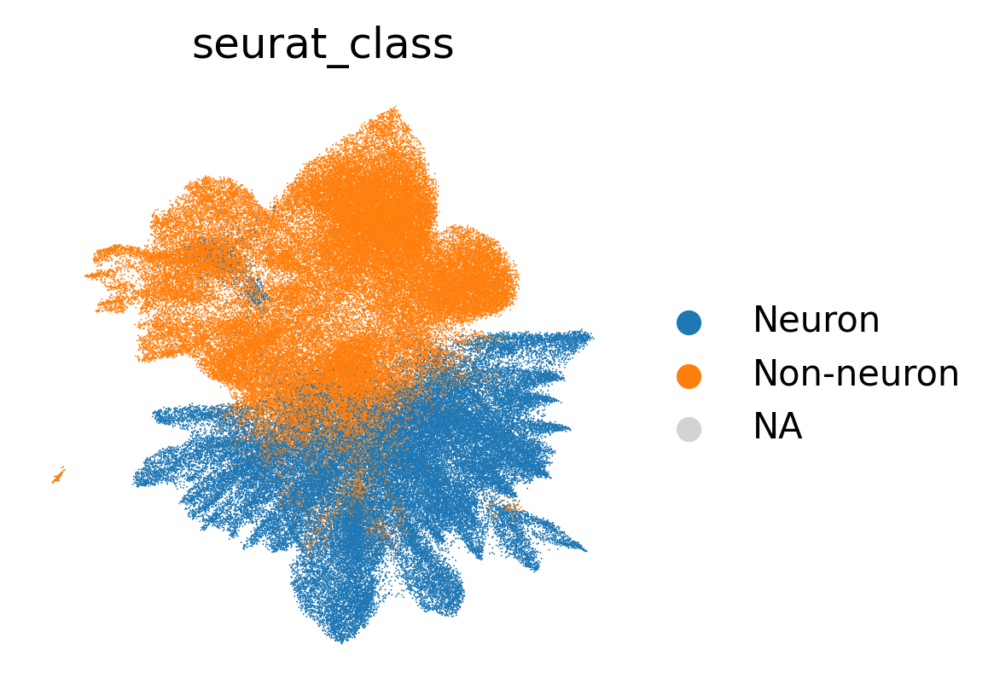

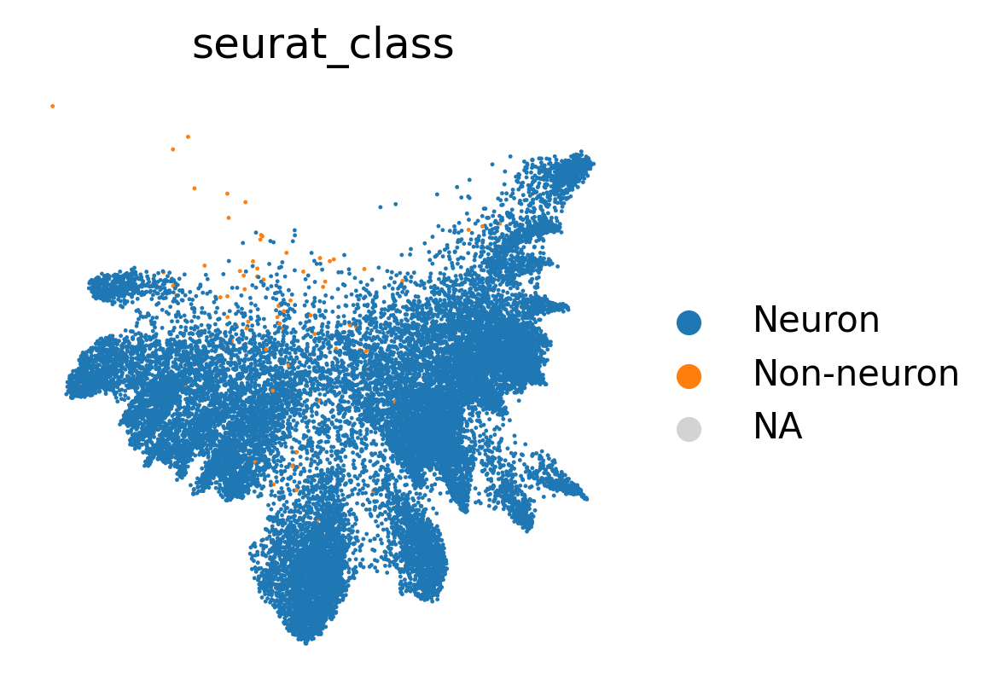

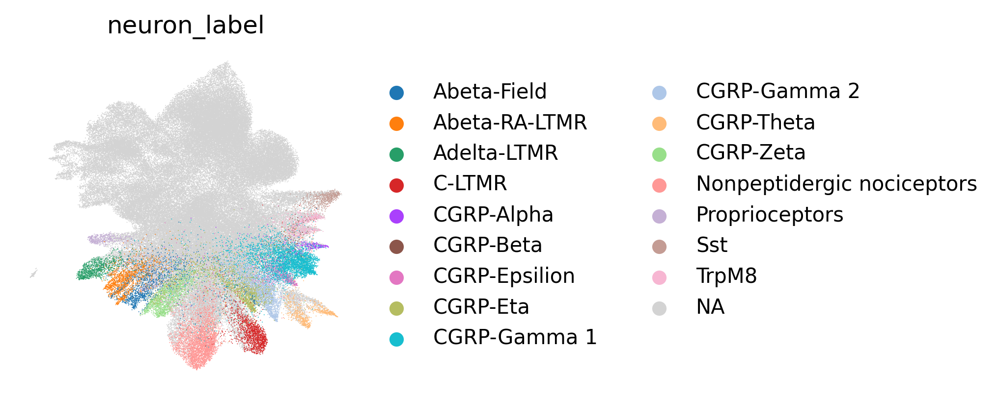

In [26]:
sc.pl.embedding(adata_merged_labels, basis = 'X_umap', color = 'seurat_class', frameon=False)
sc.pl.embedding(adata_merged_labels[adata_merged_labels.obs['total_counts']>1000, :], basis = 'X_umap', color = 'seurat_class', frameon=False)
sc.pl.embedding(adata_merged_labels, basis = 'X_umap', color = 'neuron_label', frameon=False)

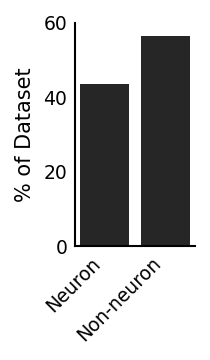

In [27]:
## plot neuron vs non-neuron fraction

# Count total and neuron fraction
counts = adata_merged_labels.obs["seurat_class"].value_counts()

neuron_count = counts.get("Neuron", 0)
total = counts.sum()
non_neuron_count = total - neuron_count

# Percentages
labels = ["Neuron", "Non-neuron"]
values = [(neuron_count / total) * 100,
          (non_neuron_count / total) * 100]

# --- Minimal plot ---
plt.figure(figsize=(1.5, 2.5), dpi=150)
plt.bar(labels, values, color=["black", "black"], alpha=0.85)   # <-- both gray

# Style: minimalist
plt.ylim(0, 60)
plt.ylabel("% of Dataset", fontsize=10)
plt.xlabel("")
plt.xticks(rotation=45, ha='right', fontsize=9)   # <-- rotated x labels
plt.yticks(fontsize=9)

# Only bottom & left spine
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)

# No tick marks
ax.tick_params(axis='y', length=0)
ax.tick_params(axis='x', length=0)

plt.tight_layout()
plt.savefig(os.path.join(plot_out_dir, f"neuron_non-neuron_fraction.pdf"), format='pdf', bbox_inches='tight')

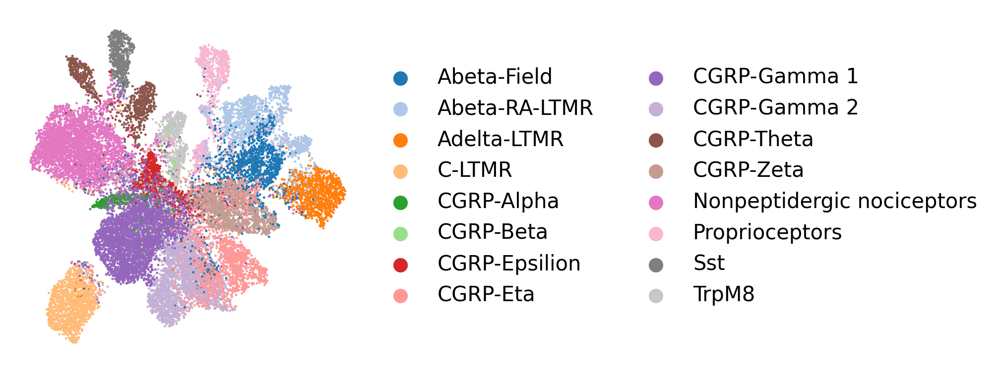

In [29]:
sc.pl.embedding(adata, basis = 'X_umap', color = 'neuron_label', title = '', frameon=False, show = False)
plt.savefig(os.path.join(plot_out_dir, f"umap_neuron_label.pdf"), format='pdf', bbox_inches='tight')

### the global umap

In [30]:
adata_480

AnnData object with n_obs × n_vars = 147036 × 480
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample_id', 'output_id', 'region_id', 'slide_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'batch', '_scvi_batch', '_scvi_labels', 'leiden_scVI_1'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'leiden_scVI_1', 'leiden_scVI_1_colors', 'neighbors', 'sample_id_colors', 'slide_id_colors', 'umap'
    obsm: 'X_scVI_ModelB_480', 'X_umap', 'spatial'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [31]:
# sc.pl.embedding(adata_480, basis = 'X_umap', color = 'leiden_scVI_1')

### Ginty reference

In [32]:
# get color palette from xenium umap and apply it to the Ginty reference
neuron_label_palette_mapped = dict(zip(
    adata.obs['neuron_label'].cat.categories, 
    adata.uns['neuron_label_colors']
))

# Ginty reference has all the same cells except has just CGRP-Gamma and also has Unknown
neuron_label_palette_mapped_ginty = neuron_label_palette_mapped.copy()
neuron_label_palette_mapped_ginty['CGRP-Gamma'] = neuron_label_palette_mapped_ginty['CGRP-Gamma 1'] 
neuron_label_palette_mapped_ginty['Unknown'] = '#E8E8E8'

In [33]:
## Save palette
import pickle

with open(os.path.join(output_dir, 'neuron_label_palette_mapped.pkl'), 'wb') as f:
    pickle.dump(neuron_label_palette_mapped, f)

with open(os.path.join(output_dir, 'neuron_label_palette_mapped_ginty.pkl'), 'wb') as f:
    pickle.dump(neuron_label_palette_mapped_ginty, f)

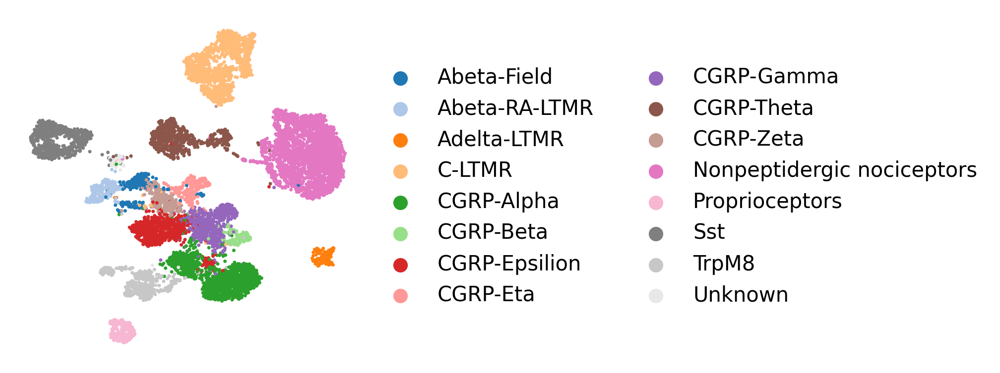

In [34]:
sc.pl.embedding(adata_reference, basis = 'X_umap', color = 'original_annotation', title = '', palette = neuron_label_palette_mapped_ginty, frameon=False, show = False)
plt.savefig(os.path.join(plot_out_dir, f"umap_ginty_label.pdf"), format='pdf', bbox_inches='tight')

In [35]:
labels = ["EGFP_Seq1_hi", "dTomato_Seq2_hi", "EGFP_dTomato_dual_hi"]

true_color_map = {
    "EGFP_Seq1_hi": "limegreen",
    "dTomato_Seq2_hi": "magenta",
    "EGFP_dTomato_dual_hi": "blue",
}

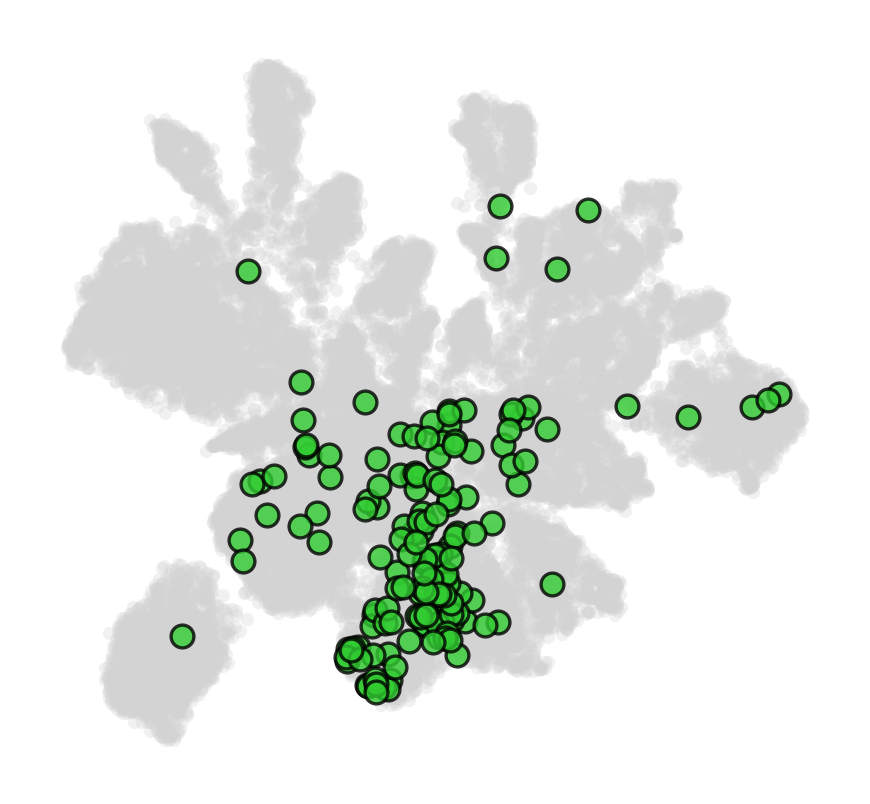

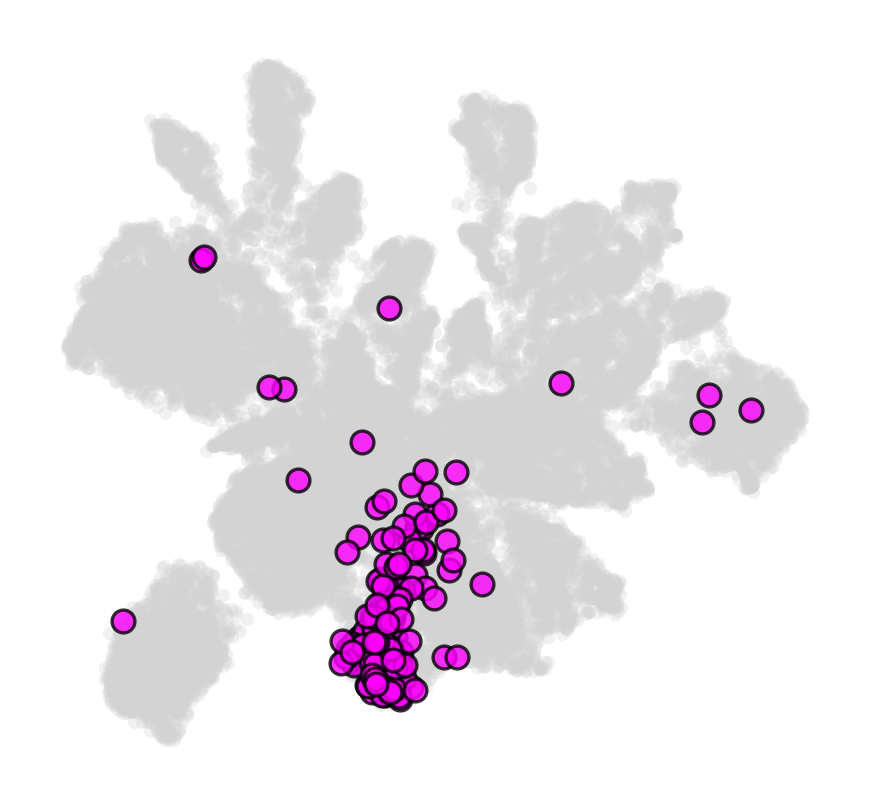

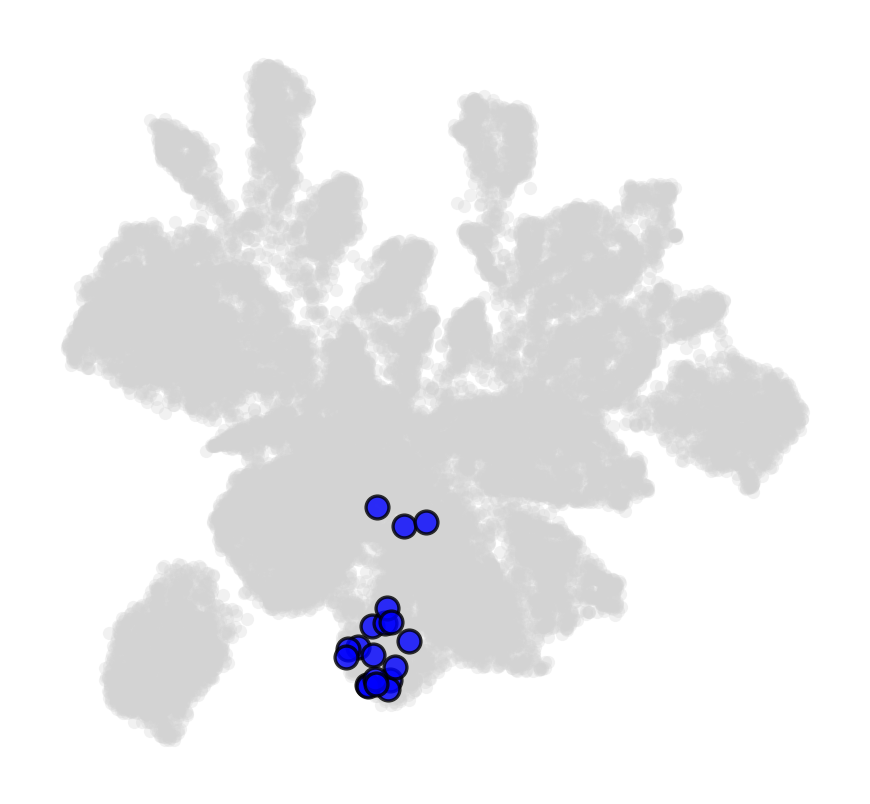

In [36]:
plot_umaps(
    adata,
    label_cols=labels,
    true_color_map=true_color_map,
    false_color="lightgray",
    true_size=30,
    false_size=10,
    edgecolor="black",
    linewidth=0.8,
    alpha_false=0.3,
    alpha_true=0.8,
    save_path = plot_out_dir
)

## Check reporter status and bar plots

In [37]:
group_col = 'neuron_label'
labels = ["EGFP_Seq1_hi", "dTomato_Seq2_hi", "EGFP_dTomato_dual_hi"]
for dual_col in labels:
    # output 
    df = adata.obs[[group_col, dual_col]].copy()
    df[dual_col] = df[dual_col].astype(bool)
    df[group_col] = df[group_col].astype(str).replace("nan", "Unknown")
    
    # Count dual positives per group (correct)
    dual_counts = df.groupby(group_col)[dual_col].sum()
    
    total_dual = dual_counts.sum()
    print('number +: ', total_dual)
    
    # percentage
    stats = (dual_counts / total_dual * 100).sort_values(ascending=False)
    
    count_percent_df = pd.concat([dual_counts, stats], axis=1)
    count_percent_df.columns = ['count', 'percent']
    count_percent_df = count_percent_df.sort_values(by='percent', ascending=False)
    print(count_percent_df)

number +:  158
                            count    percent
neuron_label                                
CGRP-Gamma 2                   88  55.696203
CGRP-Gamma 1                   31  19.620253
CGRP-Zeta                      14   8.860759
CGRP-Eta                       10   6.329114
CGRP-Epsilion                   4   2.531646
Adelta-LTMR                     3   1.898734
Abeta-Field                     2   1.265823
Abeta-RA-LTMR                   2   1.265823
C-LTMR                          1   0.632911
Nonpeptidergic nociceptors      1   0.632911
Proprioceptors                  1   0.632911
TrpM8                           1   0.632911
CGRP-Alpha                      0   0.000000
CGRP-Beta                       0   0.000000
CGRP-Theta                      0   0.000000
Sst                             0   0.000000
number +:  152
                            count    percent
neuron_label                                
CGRP-Gamma 2                  121  79.605263
CGRP-Gamma 1             

In [38]:
# Show single+ all together
counts_series = adata.obs.value_counts(['EGFP_Seq1_hi', 'dTomato_Seq2_hi', 'EGFP_dTomato_dual_hi'])
counts_df = counts_series.reset_index(name='cell_count')
counts_df

,EGFP_Seq1_hi,dTomato_Seq2_hi,EGFP_dTomato_dual_hi,cell_count
0,False,False,False,22120
1,True,False,False,139
2,False,True,False,133
3,True,True,True,19


In [39]:
adata.obs['reporter_status'].unique().tolist()

['Negative', 'dTomato_Seq2_hi', 'EGFP_Seq1_hi', 'EGFP_dTomato_dual_hi']

In [40]:
counts = adata.obs.value_counts(['reporter_status'])
counts

reporter_status     
Negative                22120
EGFP_Seq1_hi              139
dTomato_Seq2_hi           133
EGFP_dTomato_dual_hi       19
Name: count, dtype: int64

In [41]:
counts = adata.obs.value_counts(['EGFP_Seq1_hi'])
counts

EGFP_Seq1_hi
False           22253
True              158
Name: count, dtype: int64

In [42]:
counts = adata.obs.value_counts(['dTomato_Seq2_hi'])
counts

dTomato_Seq2_hi
False              22259
True                 152
Name: count, dtype: int64

In [43]:
counts = adata.obs.value_counts(['EGFP_dTomato_dual_hi'])
counts

EGFP_dTomato_dual_hi
False                   22392
True                       19
Name: count, dtype: int64

### Export reporter status counts as csv
We will make four versions of these csvs
1. Counts of reporter positive cells where the EGFP+ and dTomato+ counts are not single positive (e.g. they include that dual+ cells)
2. Counts of reporter positive cells where the EGFP+ and dTomato+ counts are single positive
3. For each of these 2 options, generate the table first with counts separated by cell type and then collapsed to combine all cell types

### Csvs for single positives
Use, 'reporter status' column, which already contains single+ and dual+

In [44]:
# counts by neuron label
combined_counts = adata.obs.value_counts(['neuron_label', 'reporter_status'])

combined_df = combined_counts.reset_index(name='cell_count')

# # 3. Apply your rename_map to the reporter_status column
# combined_df['reporter_status'] = combined_df['reporter_status'].map(rename_map)

# Sort for better readability (Group by neuron, then descending count)
combined_df = combined_df.sort_values(['neuron_label', 'cell_count'], ascending=[True, False])

# now collapse cell types
combined_df_collapse = combined_df.groupby('reporter_status')['cell_count'].sum().reset_index().sort_values(by='cell_count', ascending=False)

# Export
combined_df.to_csv(os.path.join(output_dir, 'neuron_label_reporter_status_single_positive.csv'), index=False)
combined_df_collapse.to_csv(os.path.join(output_dir, 'all_neurons_reporter_status_single_positive.csv'), index=False)

/tmp/ipykernel_106/4004220602.py:13: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  combined_df_collapse = combined_df.groupby('reporter_status')['cell_count'].sum().reset_index().sort_values(by='cell_count', ascending=False)


In [45]:
combined_df.head()

,neuron_label,reporter_status,cell_count
6,Abeta-Field,Negative,1449
29,Abeta-Field,EGFP_Seq1_hi,2
37,Abeta-Field,dTomato_Seq2_hi,1
5,Abeta-RA-LTMR,Negative,1461
28,Abeta-RA-LTMR,EGFP_Seq1_hi,2


In [46]:
combined_df_collapse

,reporter_status,cell_count
2,Negative,22120
0,EGFP_Seq1_hi,139
3,dTomato_Seq2_hi,133
1,EGFP_dTomato_dual_hi,19


### Csvs for all reporter positives (not requiring single positive)

Use the individual reporter True/False columns for counting

In [47]:
# counts by neuron label
single_reporter_cols = ['EGFP_Seq1_hi', 'dTomato_Seq2_hi', 'EGFP_dTomato_dual_hi']
combined_counts = adata.obs.groupby('neuron_label')[single_reporter_cols].sum()
is_negative = adata.obs[single_reporter_cols].sum(axis=1) == 0
combined_counts['Negative'] = adata.obs[is_negative].groupby('neuron_label').size()


# Reshape from "Wide" to "Long" format 
combined_df = combined_counts.stack().reset_index()

# relabel columns
combined_df.columns = ['neuron_label', 'reporter_status', 'cell_count']

# sort
combined_df = combined_df.sort_values(['neuron_label', 'cell_count'], ascending=[True, False])

# now collapse cell types
combined_df_collapse = combined_df.groupby('reporter_status')['cell_count'].sum().reset_index().sort_values(by='cell_count', ascending=False)

# Export
combined_df.to_csv(os.path.join(output_dir, 'neuron_label_reporter_status_not_single_positive.csv'), index=False)
combined_df_collapse.to_csv(os.path.join(output_dir, 'all_neurons_reporter_status_not_single_positive.csv'), index=False)

/tmp/ipykernel_106/3776613712.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  combined_counts = adata.obs.groupby('neuron_label')[single_reporter_cols].sum()
/tmp/ipykernel_106/3776613712.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  combined_counts['Negative'] = adata.obs[is_negative].groupby('neuron_label').size()


In [48]:
combined_df

,neuron_label,reporter_status,cell_count
3,Abeta-Field,Negative,1449
0,Abeta-Field,EGFP_Seq1_hi,2
1,Abeta-Field,dTomato_Seq2_hi,1
2,Abeta-Field,EGFP_dTomato_dual_hi,0
7,Abeta-RA-LTMR,Negative,1461
...,...,...,...
58,Sst,EGFP_dTomato_dual_hi,0
63,TrpM8,Negative,649
60,TrpM8,EGFP_Seq1_hi,1
61,TrpM8,dTomato_Seq2_hi,0


In [49]:
combined_df_collapse

,reporter_status,cell_count
2,Negative,22120
0,EGFP_Seq1_hi,158
3,dTomato_Seq2_hi,152
1,EGFP_dTomato_dual_hi,19


### Plot reporter status barplots

### Counts - showing reporter+ (not necessarily single positive)

number +:  19
number +:  158
number +:  152


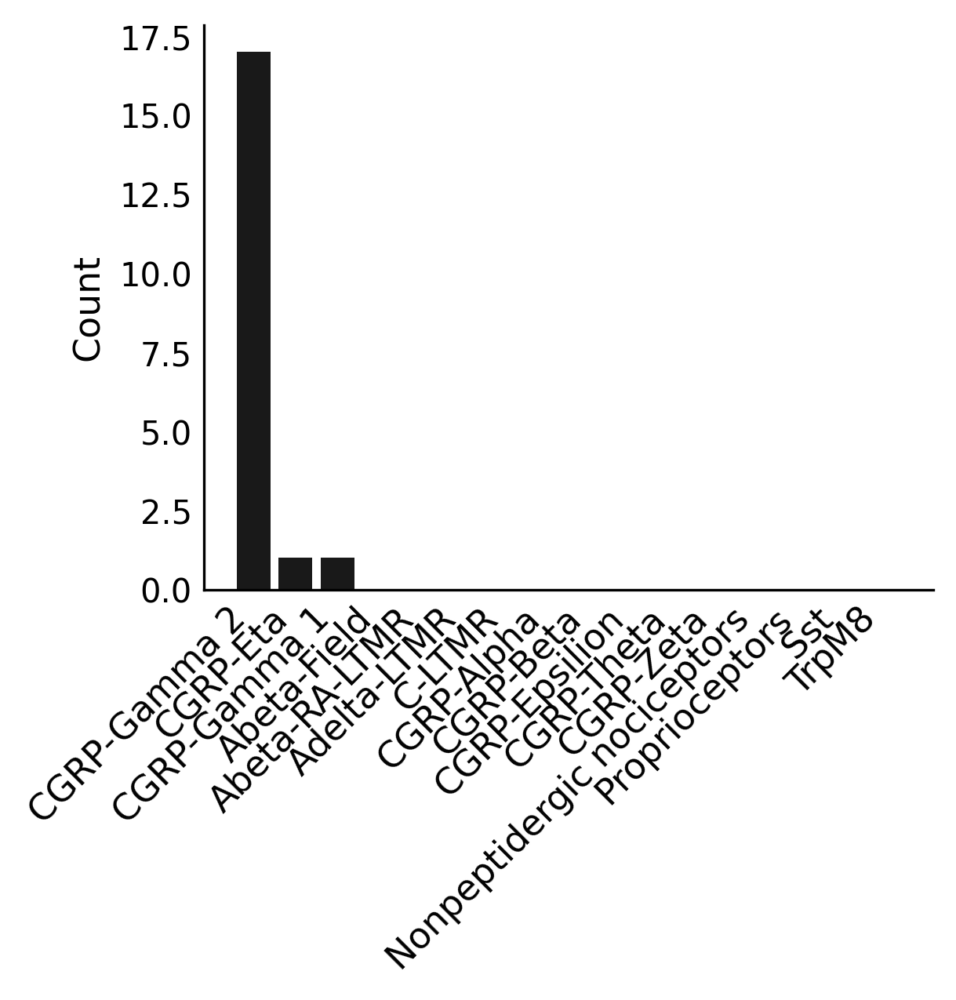

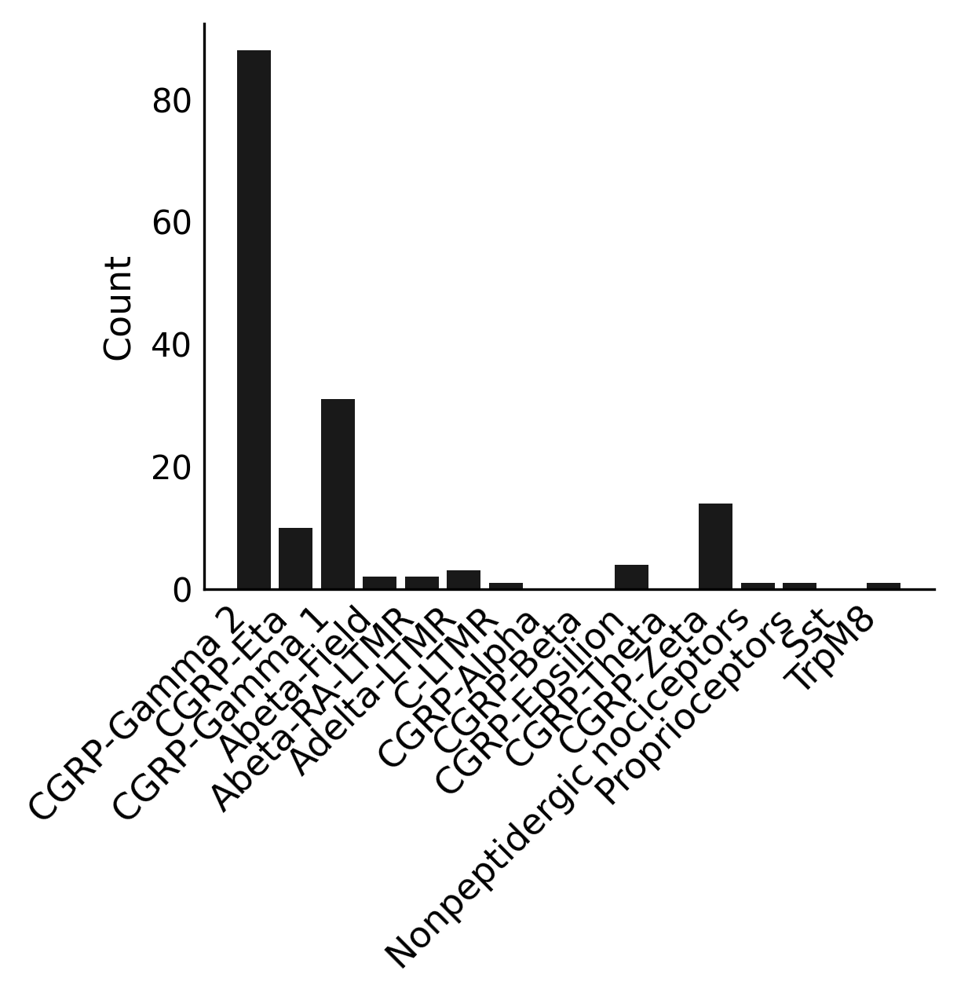

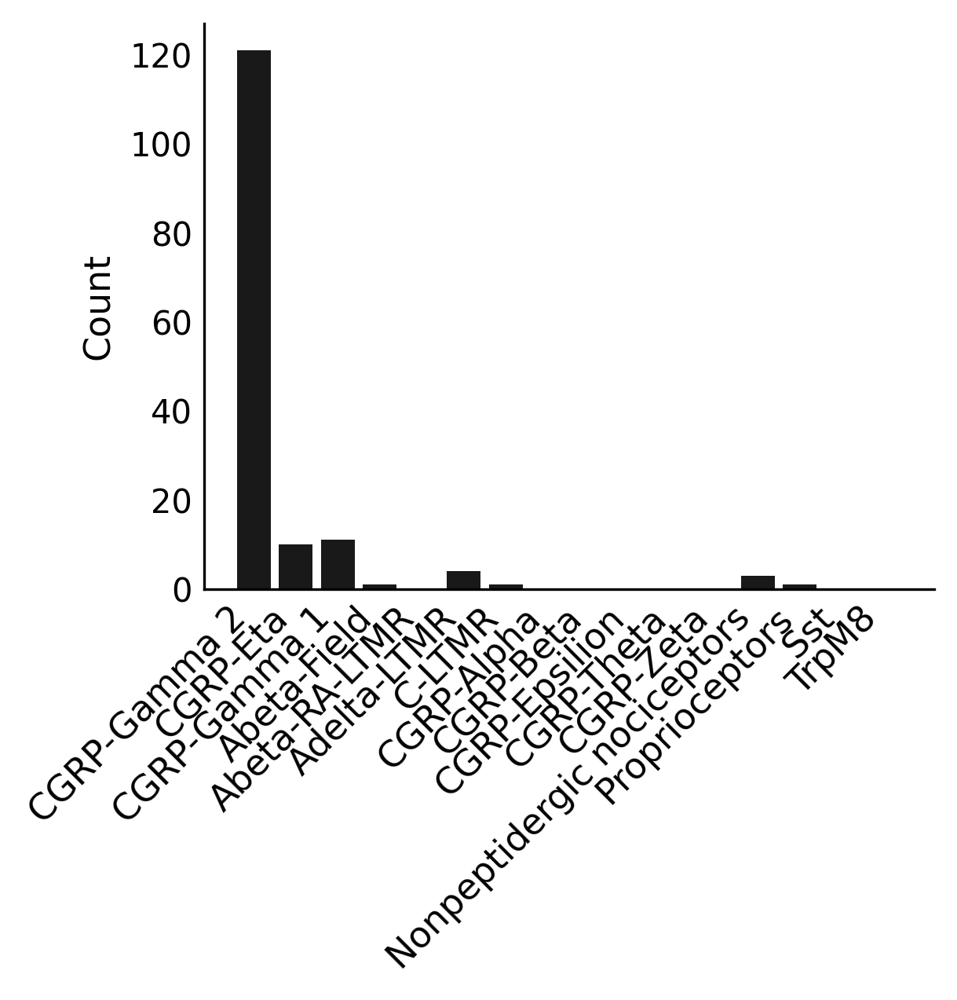

In [50]:
# set cell type order based on dual positive order
_, dual_order = barplot_dual_distribution(adata, population_name = 'Double+',
                                          dual_col="EGFP_dTomato_dual_hi",
                          return_group_order=True,
                            group_order=None)   
plt.savefig(os.path.join(plot_out_dir, "dual_distribution_count.pdf"), format='pdf', bbox_inches='tight')

barplot_dual_distribution(adata,population_name = 'EGFP+',
                          dual_col="EGFP_Seq1_hi",
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "EGFP_distribution_count.pdf"), format='pdf', bbox_inches='tight')

barplot_dual_distribution(adata,population_name = 'dTomato+',
                          dual_col="dTomato_Seq2_hi",
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "dTomato_distribution_count.pdf"), format='pdf', bbox_inches='tight')



### Counts - showing single positive only for each single reporter

number +:  139
number +:  133


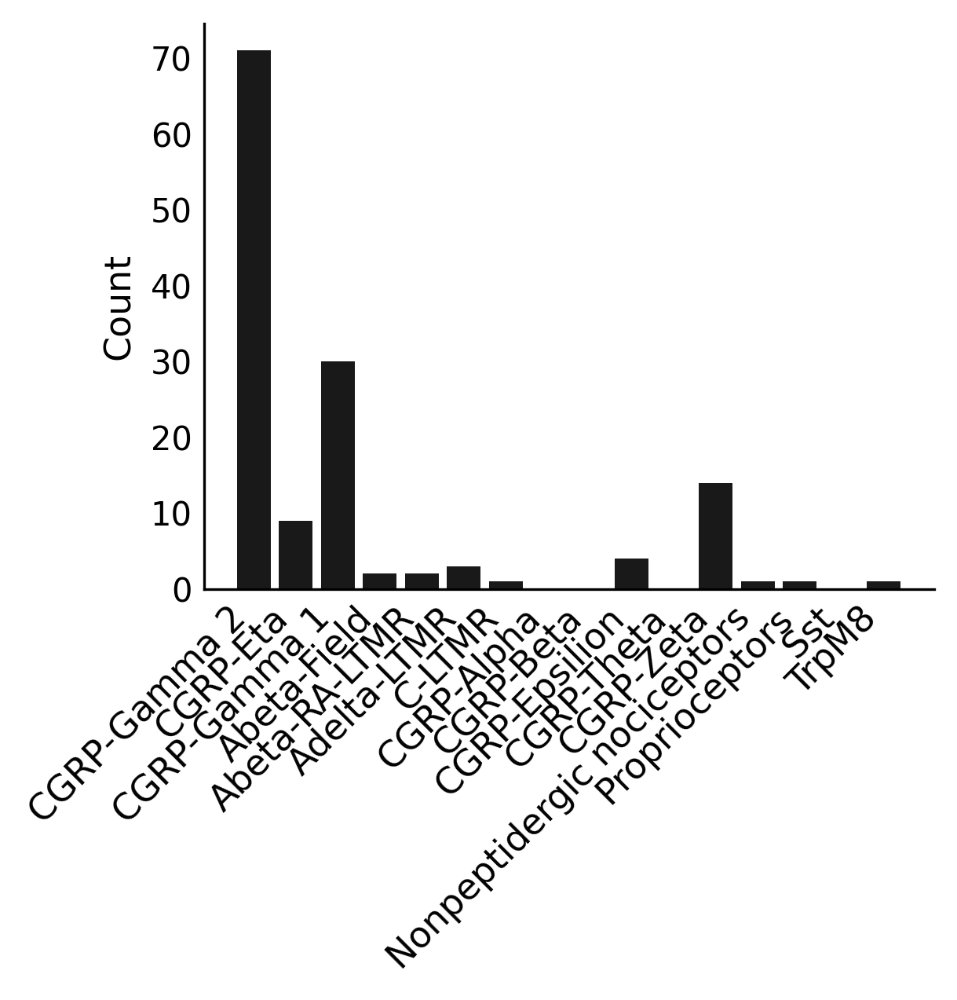

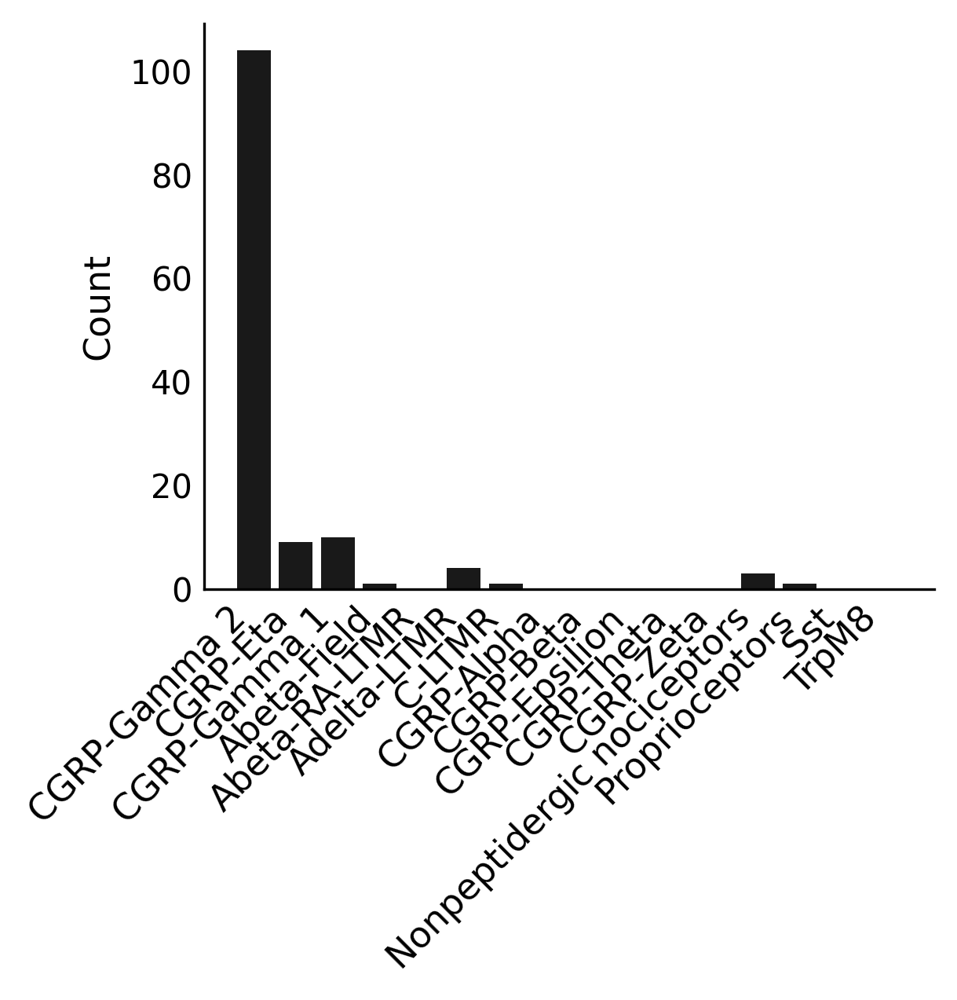

In [51]:
# set cell type order based on dual positive order

# make new temporary column 
tmp = adata.copy()
tmp.obs['EGFP_single_positive'] = False
tmp.obs['dTomato_single_positive'] = False
tmp.obs.loc[tmp.obs['reporter_status']=='EGFP_Seq1_hi', 'EGFP_single_positive'] = True
tmp.obs.loc[tmp.obs['reporter_status']=='dTomato_Seq2_hi', 'dTomato_single_positive'] = True

barplot_dual_distribution(tmp,population_name = 'EGFP+',
                          dual_col="EGFP_single_positive",
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "EGFP_distribution_count_single_positive.pdf"), format='pdf', bbox_inches='tight')

barplot_dual_distribution(tmp,population_name = 'dTomato+',
                          dual_col="dTomato_single_positive",
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "dTomato_distribution_count_single_positive.pdf"), format='pdf', bbox_inches='tight')



### Percent - showing reporter+ (not single positive)

number +:  19
number +:  158
number +:  152


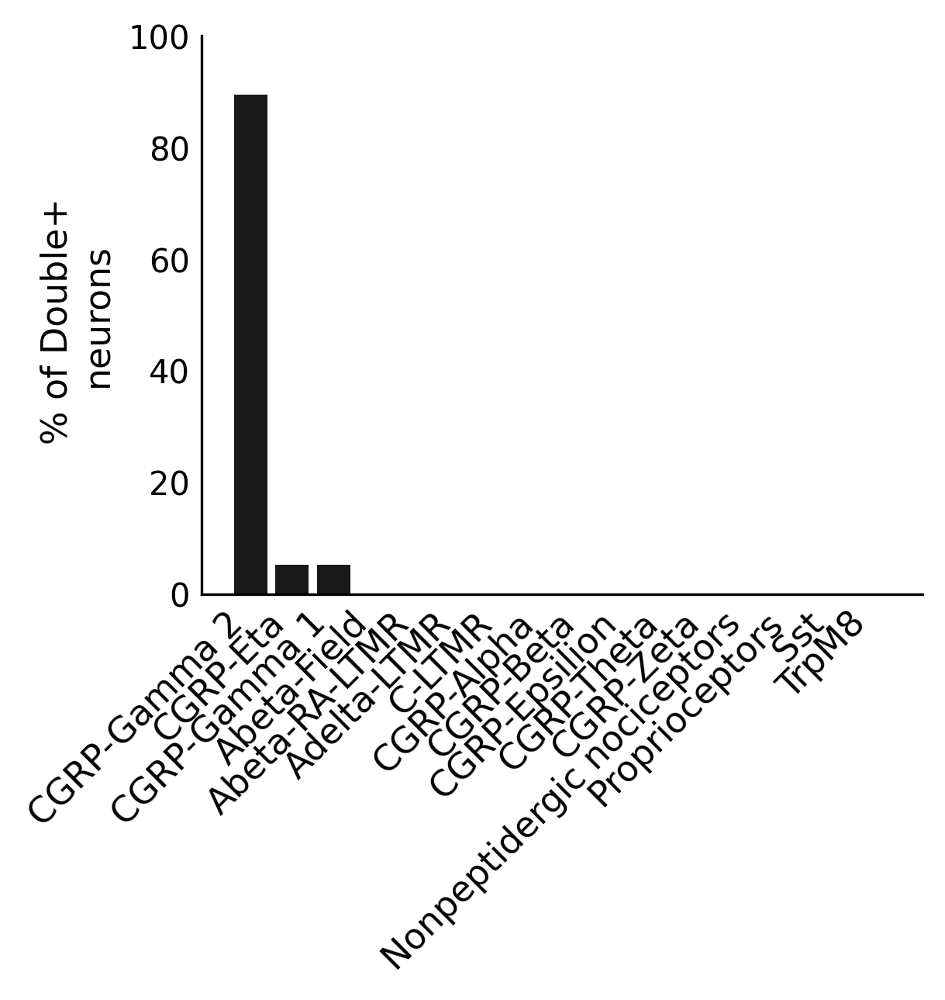

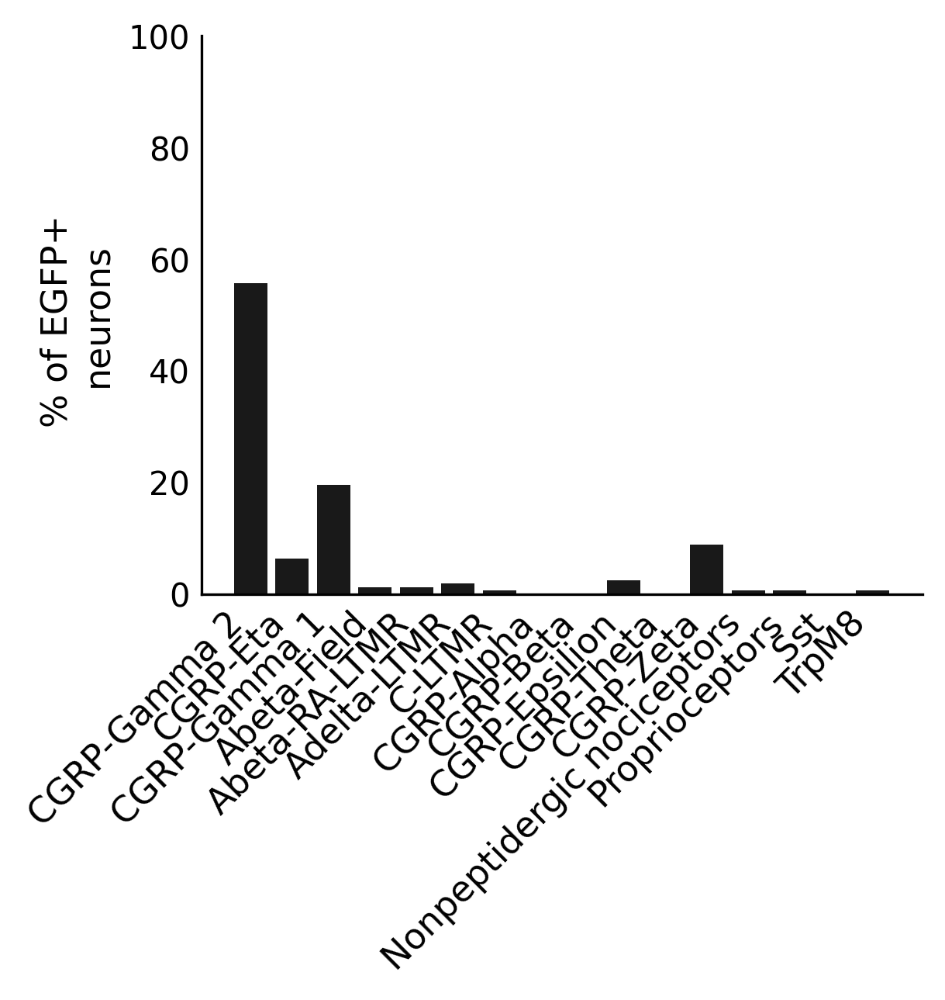

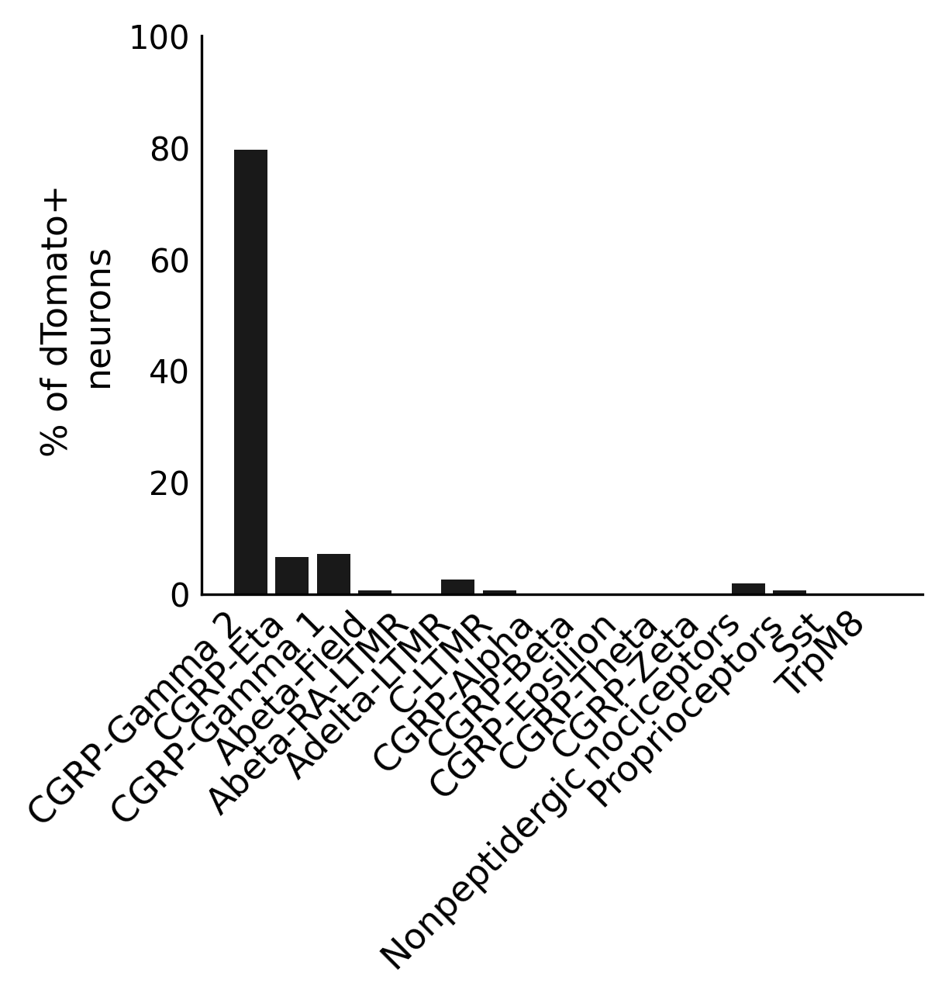

In [52]:
# use cell label ordering from dual+ counts plot above
barplot_dual_distribution(adata, population_name = 'Double+',
                          dual_col="EGFP_dTomato_dual_hi", plot_counts = False,
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "dual_distribution_percent.pdf"), format='pdf', bbox_inches='tight')

barplot_dual_distribution(adata, population_name = 'EGFP+', 
                          dual_col="EGFP_Seq1_hi", plot_counts = False,
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "EGFP_distribution_percent.pdf"), format='pdf', bbox_inches='tight')

barplot_dual_distribution(adata, population_name = 'dTomato+', 
                          dual_col="dTomato_Seq2_hi", plot_counts = False,
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "dTomato_distribution_percent.pdf"), format='pdf', bbox_inches='tight')

### Percent - showing single positive only

number +:  139
number +:  133


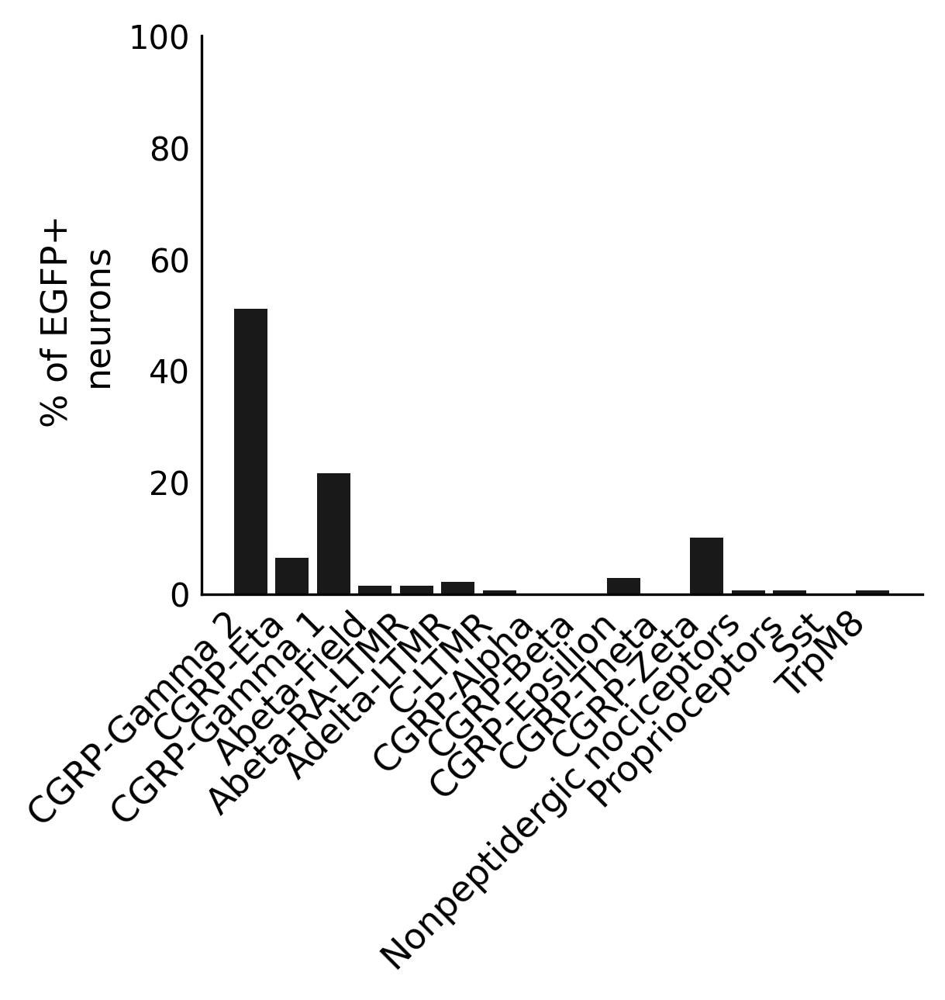

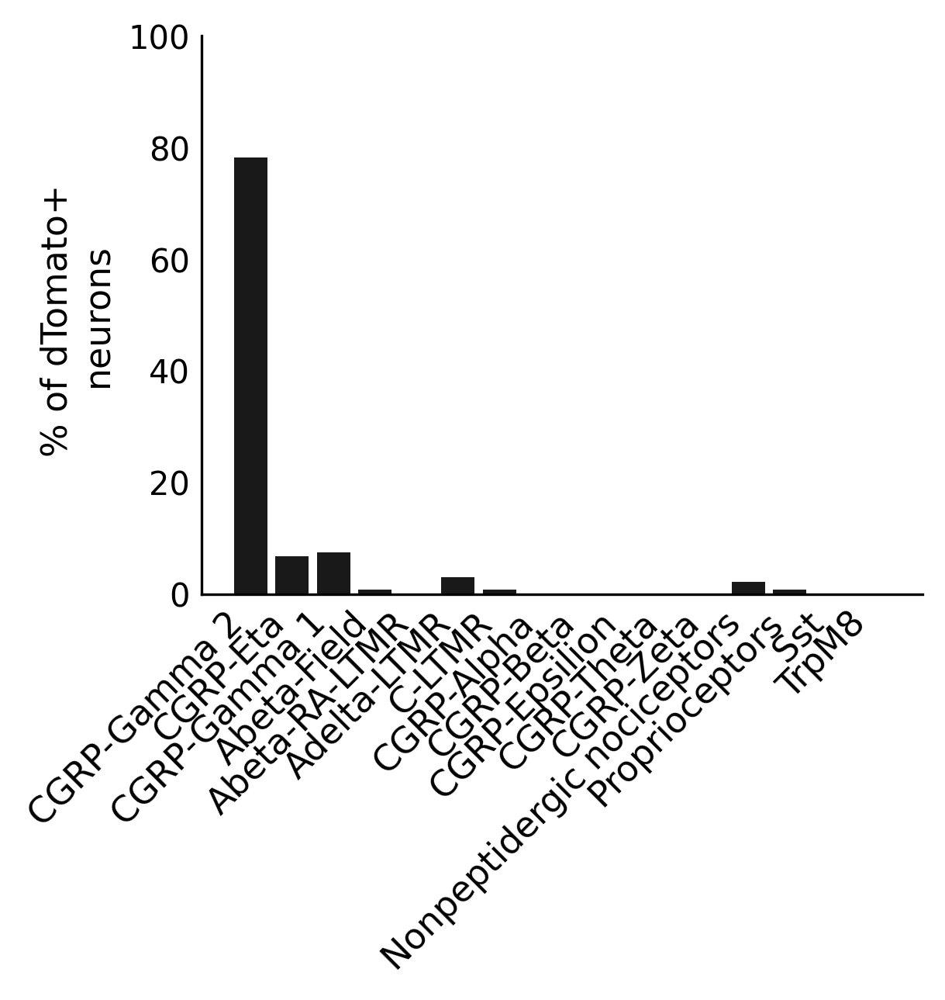

In [53]:
# set cell type order based on dual positive order

# make new temporary column 
tmp = adata.copy()
tmp.obs['EGFP_single_positive'] = False
tmp.obs['dTomato_single_positive'] = False
tmp.obs.loc[tmp.obs['reporter_status']=='EGFP_Seq1_hi', 'EGFP_single_positive'] = True
tmp.obs.loc[tmp.obs['reporter_status']=='dTomato_Seq2_hi', 'dTomato_single_positive'] = True

barplot_dual_distribution(tmp,population_name = 'EGFP+',
                          dual_col="EGFP_single_positive", plot_counts = False,
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "EGFP_distribution_percent_single_positive.pdf"), format='pdf', bbox_inches='tight')

barplot_dual_distribution(tmp,population_name = 'dTomato+',
                          dual_col="dTomato_single_positive",plot_counts = False,
                         group_order = dual_order)
plt.savefig(os.path.join(plot_out_dir, "dTomato_distribution_percent_single_positive.pdf"), format='pdf', bbox_inches='tight')



## Save label and reporter outputs for xenium explorer

In this adata object, the cell barcodes do not seen to have a suffix indicating the sample number. However, it looks like all indices are still unique. 

In [54]:
adata.obs.index.is_unique

True

In [55]:
adata.obs.head()

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,genomic_control_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,...,scanvi_class,seurat_class,neuron_recluster_seurat,innervation_pattern,neuron_labels,neuron_label,EGFP_Seq1_hi,dTomato_Seq2_hi,EGFP_dTomato_dual_hi,reporter_status
aaadagcf-1,aaadagcf-1,772.174255,2206.725830,2492,0,0,0,0,0,2492.0,...,Neuron,Neuron,1,Negative,Nonpeptidergic nociceptors,Nonpeptidergic nociceptors,False,False,False,Negative
aaaihgjh-1,aaaihgjh-1,769.295227,2240.681641,4902,0,0,1,0,0,4902.0,...,Neuron,Neuron,6,Negative,Adelta-LTMR,Adelta-LTMR,False,False,False,Negative
aabcohae-1,aabcohae-1,733.544678,2249.933838,2474,0,0,0,0,0,2474.0,...,Neuron,Neuron,6,Negative,Adelta-LTMR,Adelta-LTMR,False,False,False,Negative
aabdncpn-1,aabdncpn-1,749.500977,2226.913574,2246,0,0,0,0,0,2246.0,...,Neuron,Neuron,11,Negative,Proprioceptors,Proprioceptors,False,False,False,Negative
aacblkbe-1,aacblkbe-1,723.278809,2272.222412,1497,0,0,0,0,0,1497.0,...,Neuron,Neuron,1,Negative,Nonpeptidergic nociceptors,Nonpeptidergic nociceptors,False,False,False,Negative


In [56]:
adata.obs['sample_id'].unique().tolist()

['TMA00304',
 'TMA00306',
 'TMA00313',
 'TMA00311',
 'TMA00308',
 'TMA00303',
 'TMA00310',
 'TMA00305',
 'TMA00309',
 'TMA00307',
 'TMA00312',
 'TMA00314']

In [57]:
label_cols = ["cell_id","sample_id","neuron_label","EGFP_Seq1_hi", "dTomato_Seq2_hi", "EGFP_dTomato_dual_hi", "reporter_status"]
label_df = adata.obs[label_cols]

In [58]:
# which samples contain dual+?
counts = label_df.value_counts(['sample_id', 'EGFP_dTomato_dual_hi'])
counts

sample_id  EGFP_dTomato_dual_hi
TMA00305   False                   3769
TMA00306   False                   3750
TMA00304   False                   3149
TMA00312   False                   1958
TMA00313   False                   1869
TMA00311   False                   1760
TMA00314   False                   1589
TMA00303   False                   1471
TMA00307   False                   1221
TMA00308   False                   1210
TMA00309   False                    325
TMA00310   False                    321
TMA00306   True                       5
TMA00305   True                       5
TMA00310   True                       2
TMA00312   True                       2
TMA00304   True                       2
TMA00307   True                       1
TMA00311   True                       1
TMA00313   True                       1
Name: count, dtype: int64

In [59]:
label_df.head()

,cell_id,sample_id,neuron_label,EGFP_Seq1_hi,dTomato_Seq2_hi,EGFP_dTomato_dual_hi,reporter_status
aaadagcf-1,aaadagcf-1,TMA00304,Nonpeptidergic nociceptors,False,False,False,Negative
aaaihgjh-1,aaaihgjh-1,TMA00304,Adelta-LTMR,False,False,False,Negative
aabcohae-1,aabcohae-1,TMA00304,Adelta-LTMR,False,False,False,Negative
aabdncpn-1,aabdncpn-1,TMA00304,Proprioceptors,False,False,False,Negative
aacblkbe-1,aacblkbe-1,TMA00304,Nonpeptidergic nociceptors,False,False,False,Negative


In [60]:
label_df['neuron_label'].unique().tolist()

['Nonpeptidergic nociceptors',
 'Adelta-LTMR',
 'Proprioceptors',
 'CGRP-Eta',
 'C-LTMR',
 'CGRP-Gamma 2',
 'Abeta-RA-LTMR',
 'CGRP-Gamma 1',
 'CGRP-Zeta',
 'CGRP-Theta',
 'TrpM8',
 'CGRP-Epsilion',
 'Abeta-Field',
 'CGRP-Alpha',
 'CGRP-Beta',
 'Sst']

### Output csvs with neuron label

Add color column with hex codes from palette 

In [61]:
neuron_label_palette_mapped

{'Abeta-Field': '#1f77b4',
 'Abeta-RA-LTMR': '#aec7e8',
 'Adelta-LTMR': '#ff7f0e',
 'C-LTMR': '#ffbb78',
 'CGRP-Alpha': '#2ca02c',
 'CGRP-Beta': '#98df8a',
 'CGRP-Epsilion': '#d62728',
 'CGRP-Eta': '#ff9896',
 'CGRP-Gamma 1': '#9467bd',
 'CGRP-Gamma 2': '#c5b0d5',
 'CGRP-Theta': '#8c564b',
 'CGRP-Zeta': '#c49c94',
 'Nonpeptidergic nociceptors': '#e377c2',
 'Proprioceptors': '#f7b6d2',
 'Sst': '#7f7f7f',
 'TrpM8': '#c7c7c7'}

In [64]:
label_df_neuron_label

,cell_id,sample_id,neuron_label,EGFP_Seq1_hi,dTomato_Seq2_hi,EGFP_dTomato_dual_hi,reporter_status,group,color
aaadagcf-1,aaadagcf-1,TMA00304,Nonpeptidergic nociceptors,False,False,False,Negative,Nonpeptidergic nociceptors,#e377c2
aaaihgjh-1,aaaihgjh-1,TMA00304,Adelta-LTMR,False,False,False,Negative,Adelta-LTMR,#ff7f0e
aabcohae-1,aabcohae-1,TMA00304,Adelta-LTMR,False,False,False,Negative,Adelta-LTMR,#ff7f0e
aabdncpn-1,aabdncpn-1,TMA00304,Proprioceptors,False,False,False,Negative,Proprioceptors,#f7b6d2
aacblkbe-1,aacblkbe-1,TMA00304,Nonpeptidergic nociceptors,False,False,False,Negative,Nonpeptidergic nociceptors,#e377c2
...,...,...,...,...,...,...,...,...,...
ncikkhpf-1,ncikkhpf-1,TMA00314,CGRP-Eta,False,False,False,Negative,CGRP-Eta,#ff9896
ncikogkk-1,ncikogkk-1,TMA00314,CGRP-Epsilion,False,False,False,Negative,CGRP-Epsilion,#d62728
ncpkkekg-1,ncpkkekg-1,TMA00314,CGRP-Eta,False,False,False,Negative,CGRP-Eta,#ff9896
ndabchac-1,ndabchac-1,TMA00314,Abeta-Field,False,False,False,Negative,Abeta-Field,#1f77b4


In [68]:
# for Xenium explorer, can only have one group
label_df_neuron_label = label_df.copy()
label_df_neuron_label['group'] = label_df_neuron_label['neuron_label']
label_df_neuron_label['color'] = label_df_neuron_label['group'].map(neuron_label_palette_mapped)
label_df_neuron_label= label_df_neuron_label[['cell_id','sample_id', 'group', 'color']]

# split to individual samples
for sample in adata.obs['sample_id'].unique().tolist():
    label_df_sample = label_df_neuron_label[label_df_neuron_label['sample_id']==sample]
    # save to csv 
    label_df_sample.to_csv(os.path.join(output_dir, f"label_df_{sample}_neuron_label.csv"),index=False)

### Output csvs with reporter status

In [63]:
# for Xenium explorer, can only have one group
label_df_reporter = label_df.copy()
label_df_reporter['group'] = label_df_reporter['reporter_status']

# split to individual samples
for sample in adata.obs['sample_id'].unique().tolist():
    label_df_sample = label_df_reporter[label_df_reporter['sample_id']==sample]
    # save to csv 
    label_df_sample.to_csv(os.path.join(output_dir, f"label_df_{sample}_reporter.csv"),index=False)

## Subcluster CGRP gamma 

- Re-running MC subclustering code and saving updated visualizations
- Confirming I get the same plot results as MC

In [83]:
# 1. Subset to the CGRP-Gamma population
gamma_adata = adata[adata.obs['seurat_labels'] == 'CGRP-Gamma'].copy()

# 2. Use scVI latent space instead of PCA for neighbors
sc.pp.neighbors(gamma_adata, use_rep='X_scVI_seurat_neuron')
sc.tl.umap(gamma_adata)
sc.tl.leiden(gamma_adata, resolution=0.1, key_added='gamma_subclusters')

# 3. Identify G1 vs G2 based on Chrna3 mean expression
# Temporarily pull gene expression into .obs to allow grouping
gamma_adata.obs['Chrna3_temp'] = gamma_adata[:, 'Chrna3'].X.toarray().flatten()

cluster_expr = gamma_adata.obs.groupby('gamma_subclusters', observed=False)['Chrna3_temp'].mean()
g2_cluster = cluster_expr.idxmax()
g1_cluster = cluster_expr.idxmin()

/home/workspace/environment/sc-scvi/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/tmp/ipykernel_1768/1444506293.py:7: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(gamma_adata, resolution=0.1, key_added='gamma_subclusters')


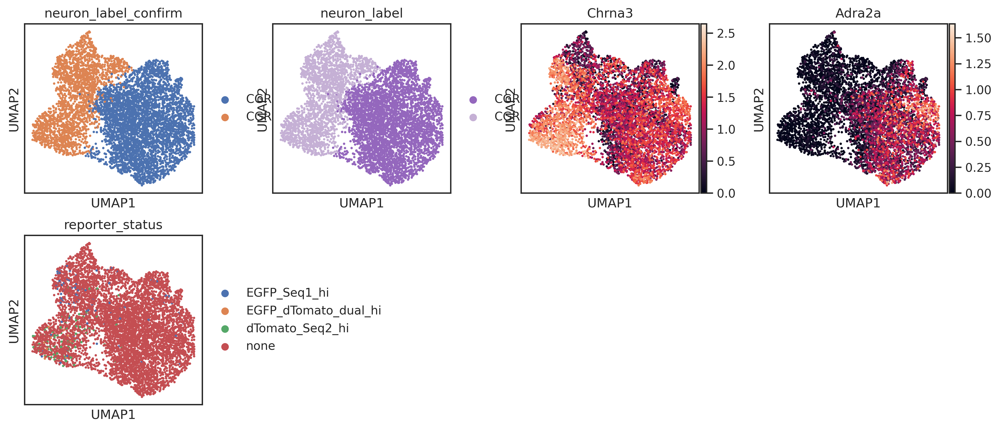

In [84]:
# Clean up the temporary column to avoid plotting conflicts
del gamma_adata.obs['Chrna3_temp']

# 4. Create the final labels
label_map = {g1_cluster: 'CGRP-Gamma 1', g2_cluster: 'CGRP-Gamma 2'}
gamma_adata.obs['neuron_label_confirm'] = gamma_adata.obs['gamma_subclusters'].map(label_map)

# 5. Visualize to confirm the split
sc.pl.umap(gamma_adata, color=['neuron_label_confirm', 'neuron_label', 'Chrna3', 'Adra2a', 'reporter_status'])

### Save CGRP visualizations

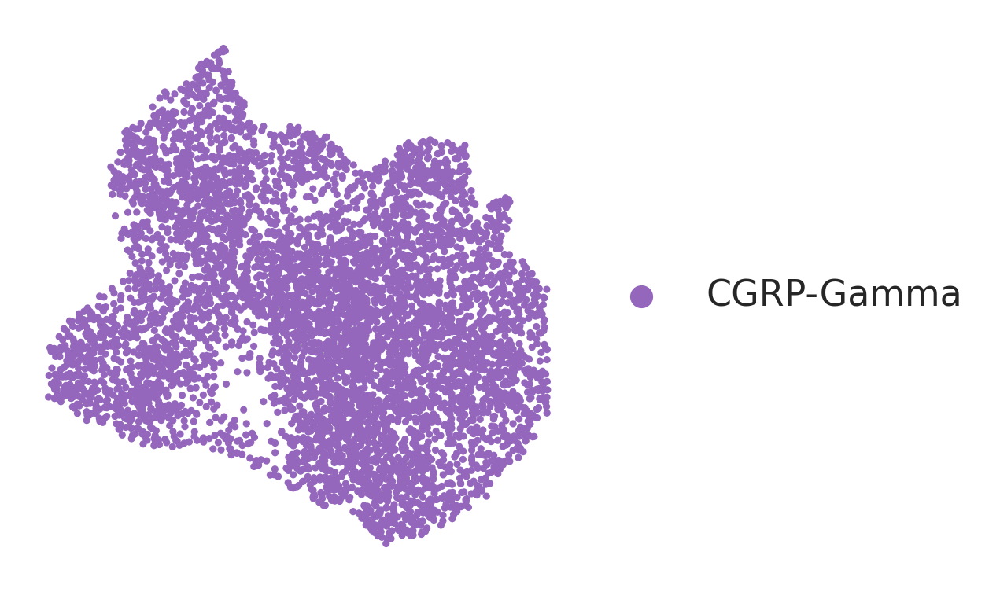

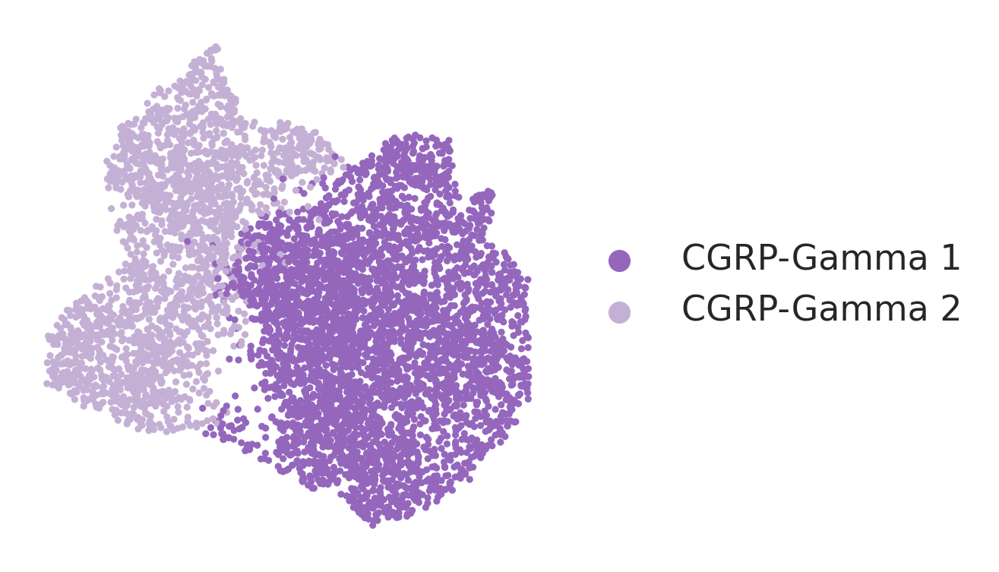

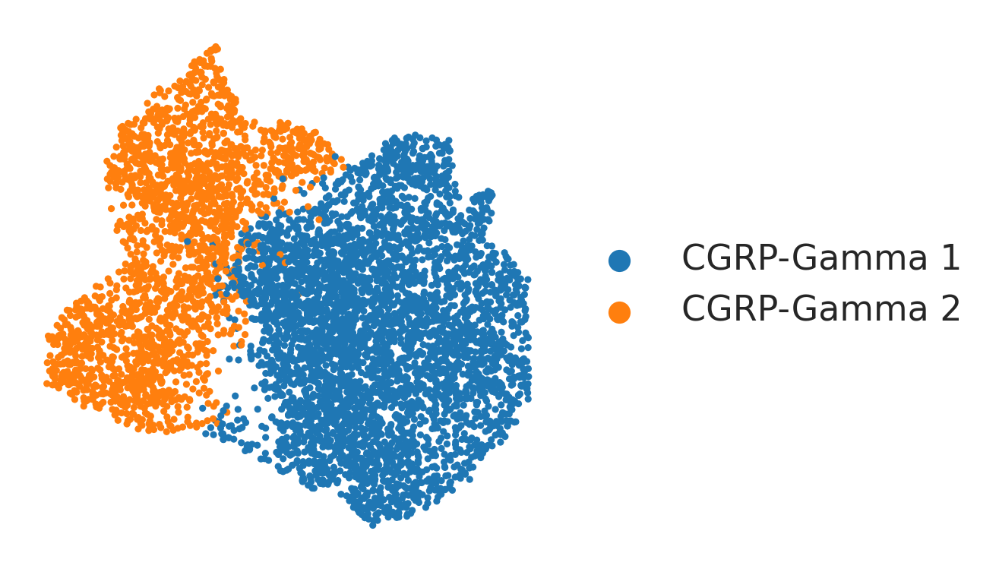

In [85]:
sc.pl.umap(gamma_adata, color='seurat_labels', frameon = False, title = '', show = False)
plt.savefig(os.path.join(plot_out_dir, f"CGRP_umap_all.pdf"), format='pdf', bbox_inches='tight')

sc.pl.umap(gamma_adata, color='neuron_label', frameon = False, title = '', show = False)
plt.savefig(os.path.join(plot_out_dir, f"CGRP_neuron_label.pdf"), format='pdf', bbox_inches='tight')

sc.pl.umap(gamma_adata, color='neuron_label', frameon = False, title = '', palette = ['#1f77b4', '#ff7f0e'], show = False)
plt.savefig(os.path.join(plot_out_dir, f"CGRP_neuron_label_blue_orange.pdf"), format='pdf', bbox_inches='tight')



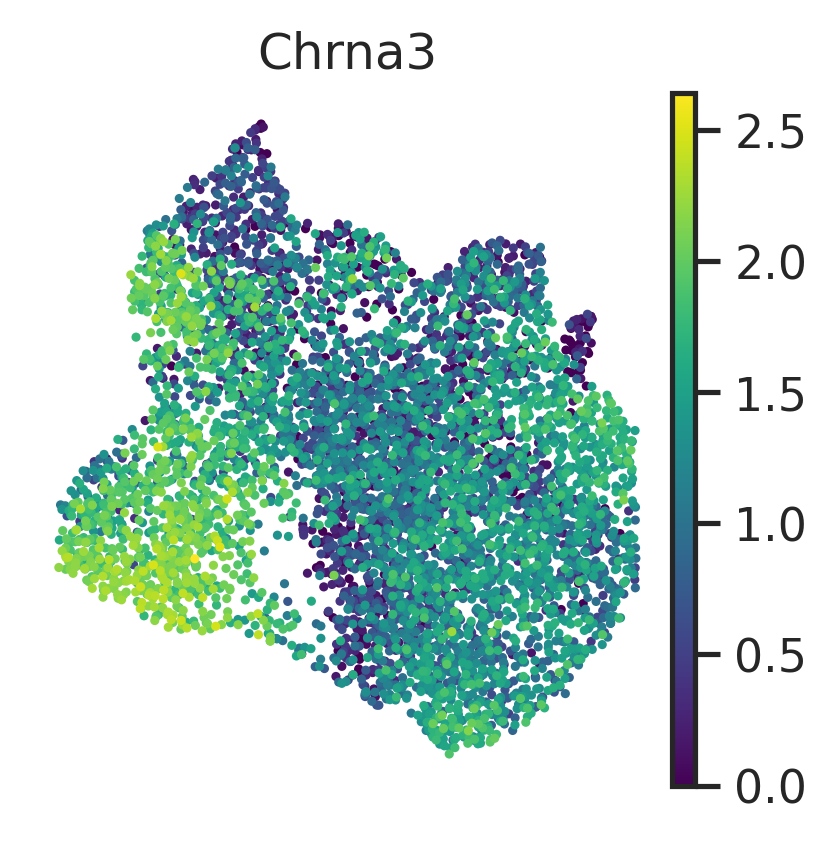

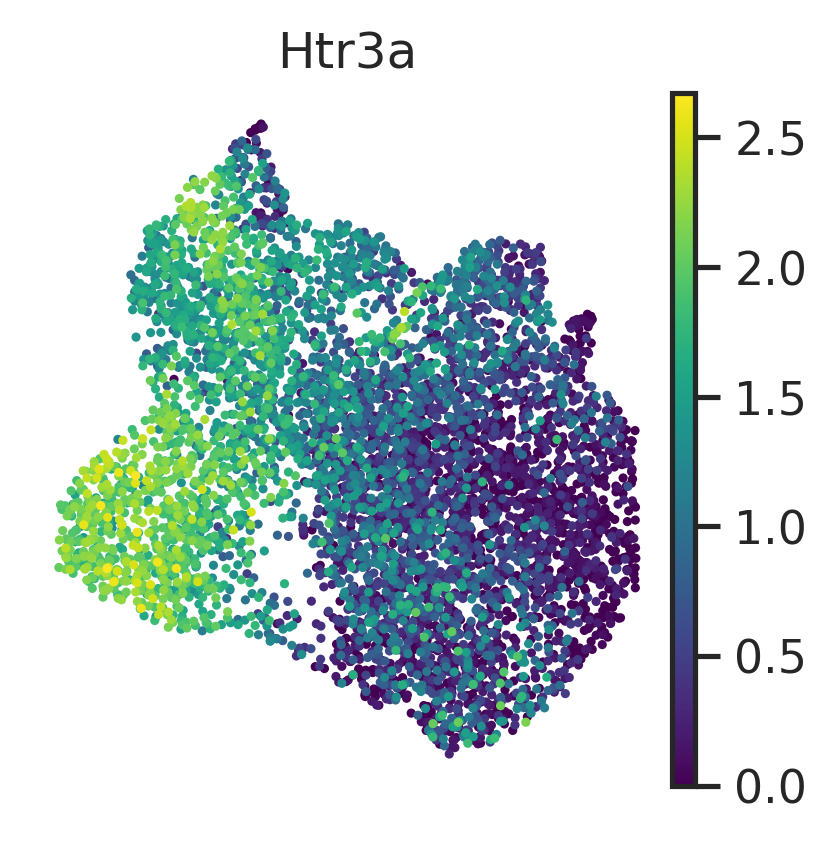

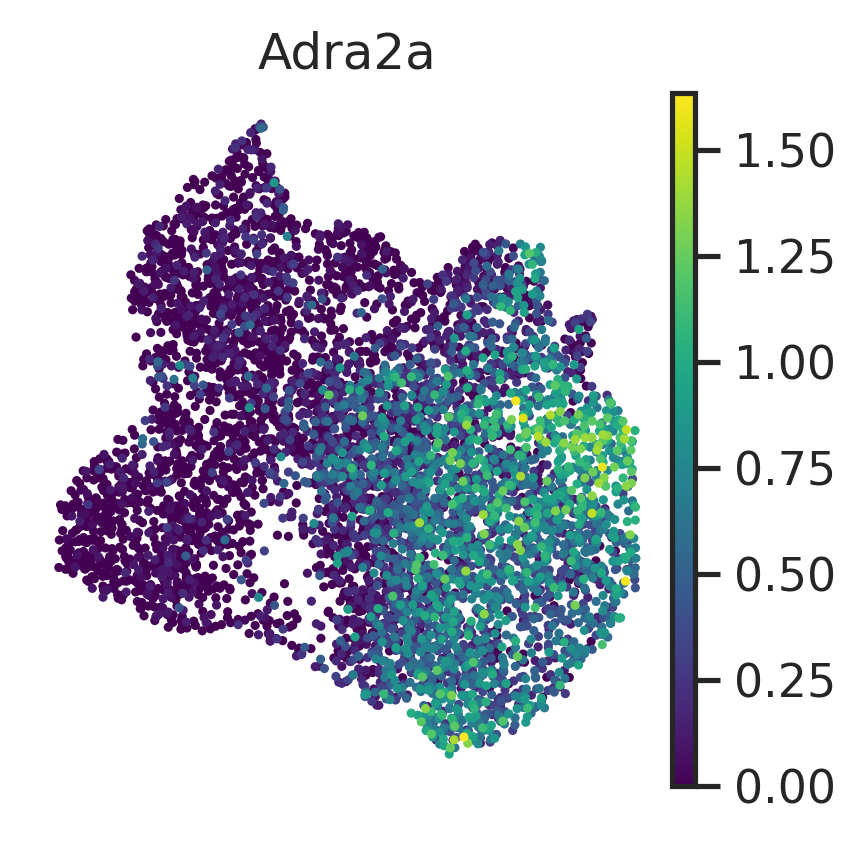

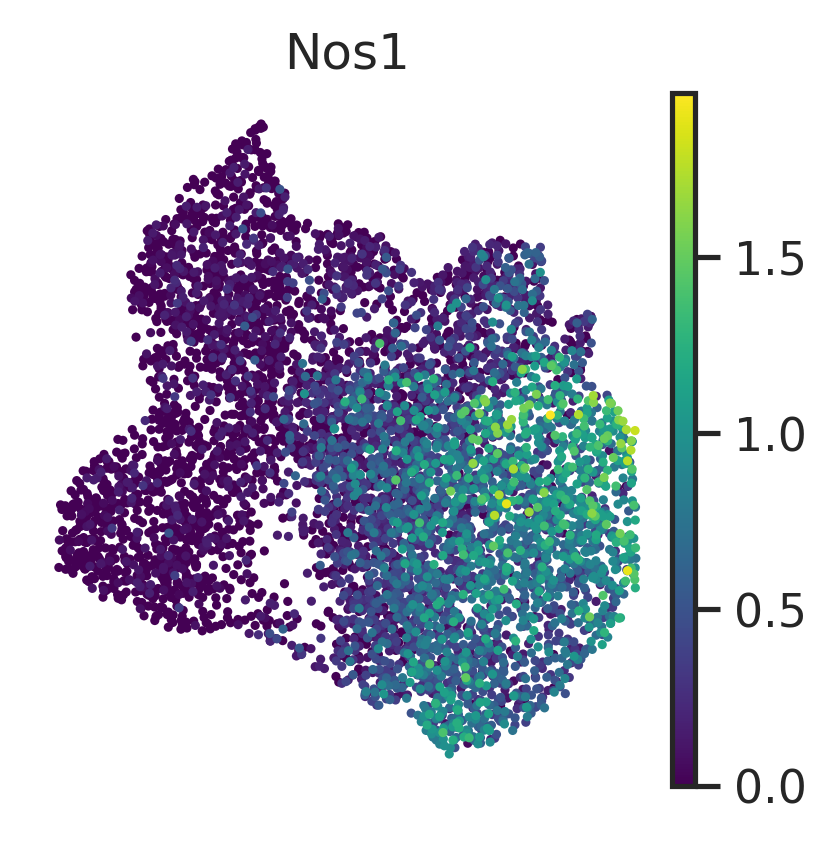

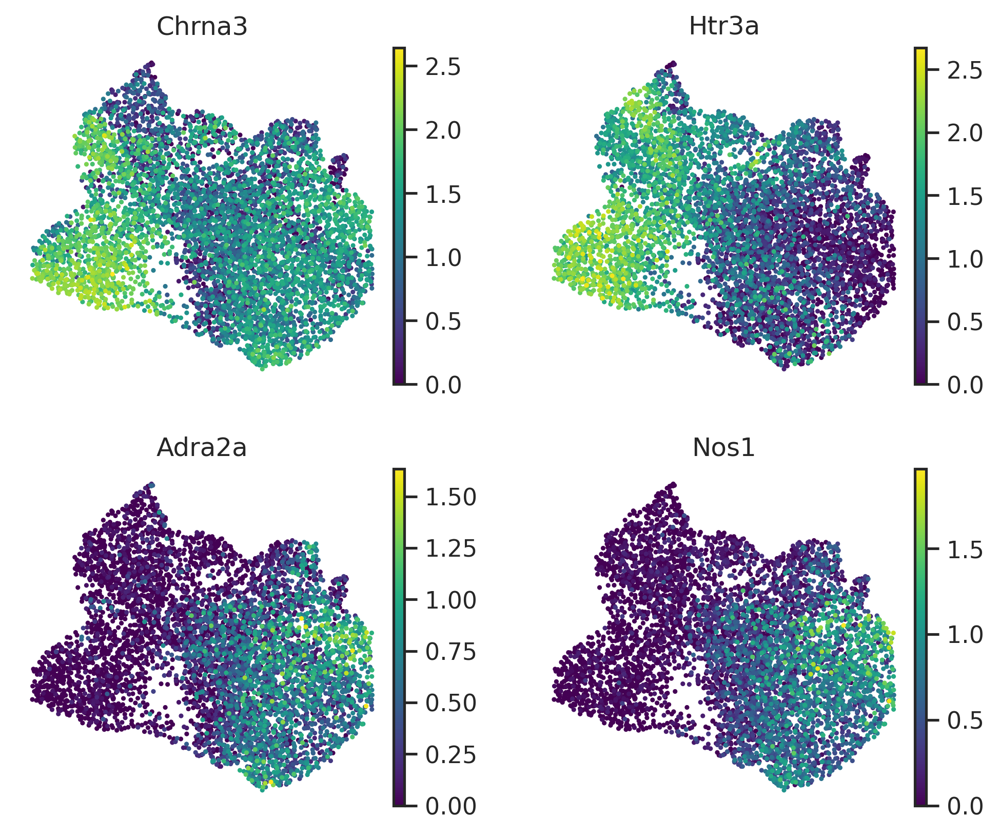

In [104]:
sc.pl.embedding(gamma_adata, basis = 'X_umap', color='Chrna3', cmap = 'viridis', frameon = False, show = False)
plt.savefig(os.path.join(plot_out_dir, f"CGRP_Chrna3.pdf"), format='pdf', bbox_inches='tight')

sc.pl.embedding(gamma_adata, basis = 'X_umap', color='Htr3a', cmap = 'viridis', frameon = False, show = False)
plt.savefig(os.path.join(plot_out_dir, f"CGRP_Htr3a.pdf"), format='pdf', bbox_inches='tight')

sc.pl.embedding(gamma_adata, basis = 'X_umap', color='Adra2a', cmap = 'viridis', frameon = False, show = False)
plt.savefig(os.path.join(plot_out_dir, f"CGRP_Adra2a.pdf"), format='pdf', bbox_inches='tight')

sc.pl.embedding(gamma_adata, basis = 'X_umap', color='Nos1', cmap = 'viridis', frameon = False, show = False)
plt.savefig(os.path.join(plot_out_dir, f"CGRP_Nos1.pdf"), format='pdf', bbox_inches='tight')

sc.pl.embedding(gamma_adata, basis = 'X_umap', color=['Chrna3','Htr3a','Adra2a','Nos1'], cmap = 'viridis', ncols = 2, frameon = False, show = False)
plt.savefig(os.path.join(plot_out_dir, f"CGRP_all4genes.pdf"), format='pdf', bbox_inches='tight')

### Proportions bar plot, extended data f

In [124]:
def plot_dual_fraction_among_dtom(
    adata,
    dtom_col="dTomato_Seq2_hi",
    dual_col="EGFP_dTomato_dual_hi",
    mode="counts",  # Options: "counts" or "percent"
    colors=None,
    figsize=(3, 3)
):
    import seaborn as sns
    import matplotlib.pyplot as plt

    # 1. Logic for colors and masks (same as before)
    if colors is None:
        colors = {"Single": "crimson", "Dual": "gold"}

    dtom_mask = adata.obs[dtom_col].astype(bool)
    dual_mask = adata.obs[dual_col].astype(bool)

    n_dtom_total = dtom_mask.sum()
    n_dual = (dtom_mask & dual_mask).sum()
    n_dtom_only = n_dtom_total - n_dual

    # 2. Switch between Counts and Percent
    if mode == "percent":
        values = [(n_dtom_only / n_dtom_total * 100), (n_dual / n_dtom_total * 100)]
        ylabel = "Percent of dTom+ cells"
        fmt = ".1f" # Format for labels
        suffix = "%"
    else:
        values = [n_dtom_only, n_dual]
        ylabel = "Number of cells"
        fmt = "d" # Format for labels (integer)
        suffix = ""

    categories = ["dTom-only", "Dual+"]
    plot_colors = [colors["Single"], colors["Dual"]]

    # 3. Plotting
    plt.figure(figsize=figsize)
    bars = plt.bar(categories, values, color=plot_colors, edgecolor="black")

    # 4. Add dynamic labels on top of bars
    for bar, val in zip(bars, values):
        # We still show both raw and % in the text label for clarity
        raw_val = n_dtom_only if bar.get_x() < 0.5 else n_dual
        perc = (raw_val / n_dtom_total * 100)
        
        plt.text(
            bar.get_x() + bar.get_width()/2,
            val,
            f"{raw_val}\n({perc:.1f}%)",
            ha="center", va="bottom", fontsize=10
        )

    plt.ylabel(ylabel)
    
    sns.despine() # Remove top and right box
    plt.tight_layout()
    # plt.show()

    return {"fraction_dual": n_dual / n_dtom_total}

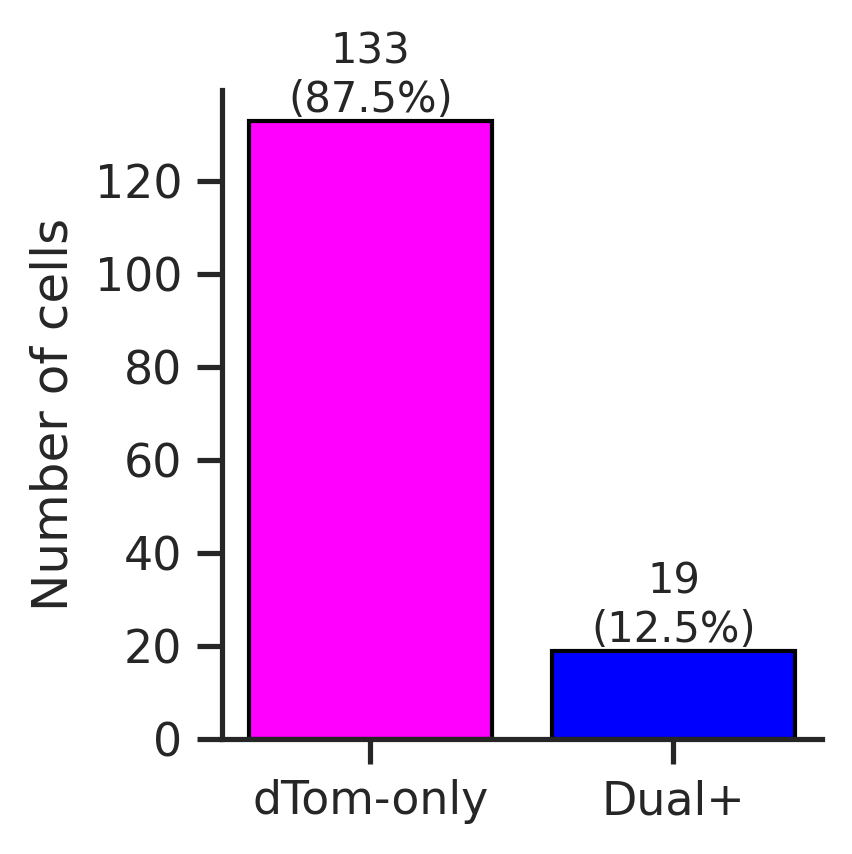

In [125]:
stats = plot_dual_fraction_among_dtom(
    adata,
    colors={
        "Single": "magenta",
        "Dual": "blue"
    }
)
plt.savefig(os.path.join(plot_out_dir, f"dtomato_percent_dual_counts.pdf"), format='pdf', bbox_inches='tight')

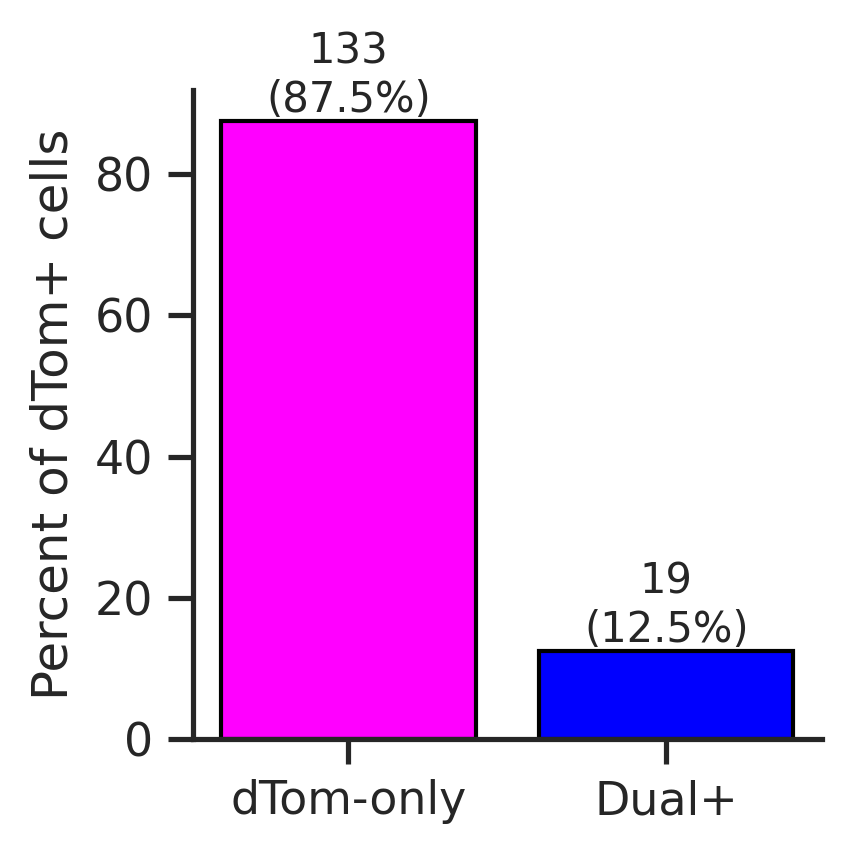

In [126]:
stats = plot_dual_fraction_among_dtom(
    adata,
    mode='percent',
    colors={
        "Single": "magenta",
        "Dual": "blue"
    }
)
plt.savefig(os.path.join(plot_out_dir, f"dtomato_percent_dual_percent.pdf"), format='pdf', bbox_inches='tight')

# Investigating Abeta GFP+ cells

## Where are they in the guassian thresholding map?

In [ ]:
adata.obs.columns

In [ ]:
adata.obs['neuron_label'].unique().tolist()

In [ ]:
test_classes = plot_gaussian(adata_480, 
                        genes = ["EGFP_Seq1", "dTomato_Seq2"],
                        # gene_thresholds = (0.9995, 0.99),
                        gene_thresholds = (0.99, 0.99),      
                        # gene_thresholds = (0.995, 0.99),
                        set_thresholds_on_dual_subsetted_data = True,
                        highlight_color = "green",
                        highlight_size = 10,
                        return_reporter_classes = True)

In [ ]:
# set up masks

# ab gfp+ cells
ab_gfp_mask = (adata.obs['EGFP_Seq1_hi']==True) & (adata.obs['neuron_label']=='Abeta-RA-LTMR')
print(sum(ab_gfp_mask))
ab_gfp_barcodes = adata.obs_names[ab_gfp_mask]

# all neurons
all_neurons_barcodes = adata.obs_names

In [ ]:
test_classes = plot_gaussian(adata_480, 
                        genes = ["EGFP_Seq1", "dTomato_Seq2"],
                        gene_thresholds = (0.9995, 0.99),
                        # gene_thresholds = (0.99, 0.99),      
                        # gene_thresholds = (0.995, 0.99),
                        set_thresholds_on_dual_subsetted_data = False,
                        highlight_barcodes = ab_gfp_barcodes.tolist(),
                        highlight_color = "green",
                        highlight_size = 10,
                        return_reporter_classes = True)

In [ ]:
test_classes_neurons = test_classes[test_classes.index.isin(all_neurons_barcodes)]

In [ ]:
sum(test_classes_neurons[test_classes_neurons.index.isin(ab_gfp_barcodes)]['EGFP_Seq1_hi'])

In [ ]:
sum(test_classes_neurons['EGFP_dTomato_dual_hi'])

## Test area filtering - does is remove AB single positive cells? 

No it does not


In [ ]:
group_col = 'neuron_label'
areas = adata.obs[['cell_area', group_col]].copy()
areas[group_col] = areas[group_col].astype(str).replace("nan", "Unknown")

# Loop through each unique neuron type
for label in areas[group_col].unique():
    subset = areas[areas[group_col] == label]
    
    plt.figure(figsize=(3, 2))
    plt.hist(subset['cell_area'], bins=100, color='skyblue', edgecolor='black')
    plt.axvline(100, linestyle = '--')
    plt.title(f"{label}")
    plt.xlabel("Area")
    plt.ylabel("Count")
    sns.despine()
    plt.show()

In [ ]:
min_area = 100
adata_area_filter = adata[adata.obs['cell_area']>min_area, :].copy()
print(adata.shape)
print(adata_area_filter.shape)

In [ ]:
group_col = 'neuron_label'
dual_col = 'EGFP_Seq1_hi'
# dual_col = 'EGFP_dTomato_dual_hi'
# output 
df = adata_area_filter.obs[[group_col, dual_col]].copy()
df[dual_col] = df[dual_col].astype(bool)
df[group_col] = df[group_col].astype(str).replace("nan", "Unknown")

# Count dual positives per group (correct)
dual_counts = df.groupby(group_col)[dual_col].sum()

total_dual = dual_counts.sum()
print('number +: ', total_dual)

# percentage
stats = (dual_counts / total_dual * 100).sort_values(ascending=False)

count_percent_df = pd.concat([dual_counts, stats], axis=1)
count_percent_df.columns = ['count', 'percent']
count_percent_df = count_percent_df.sort_values(by='percent', ascending=False)
count_percent_df